# Feature evolution

## 1 Setup

Flags

In [1]:
SAVE_FIGURES = False

Setup the database

In [2]:
import os, sys
sys.path.insert(1, os.path.abspath('..'))
from utils import setup_spreadr

FIG = os.path.join(os.path.abspath(os.path.curdir), '{}.png')
DB_NAME = 'spreadr' + os.path.split(os.path.abspath(os.path.curdir))[1][9:]
setup_spreadr(DB_NAME)
print('Database:', DB_NAME)

Database: spreadr_exp_2


Imports for the analysis

In [3]:
from itertools import combinations
import pickle

%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.patches import Patch
import pandas as pd
import numpy as np
from scipy import stats
from scipy.spatial import distance
from nltk.corpus import stopwords as nltk_stopwords
from nltk.corpus import brown
import seaborn as sb
import spacy

from gists.models import Sentence, Tree, GistsConfiguration

from utils import memoized, mpl_palette
from language_model import NgramModel
from settings import MODEL_TEMPLATE

config = GistsConfiguration.get_solo()

Equip models with useful tools

In [4]:
from utils import equip_spreadr_models as utils_equip
utils_equip()

from linguistics import equip_spreadr_models as linguistics_equip
linguistics_equip()

Create our spaCy instance (only run this once! It's a memory hog)

In [5]:
nlp = spacy.load('en')

## 2 Long-term sentence feature evolution

### A note on the features used

The following features, defined on the sentences themselves, are used in the plots below:
* `token length`: number of words in the sentence.
* `content length`: number of content words in the sentence.
* `root memorable`: whether the root sentence was marked as a memorable quote or not.
* `oc rate`: "ordered content transformation rate". Measures how a sentence is transformed when rewritten. It's the levenshtein distance between the lists of content words of the sentence and its direct child, normalised to the maximum length of that list for child or parent. Depending on the graph, root sentences are counted as a single measure (with `oc rate` averaged over their children), or are counted as a separate measure for each child, whichever makes more sense.
* `oc transmitted`: "ordered content transmitted". Measures whether the list of content words of a sentence was transmitted perfectly or not (same words, same order). It's a boolean, represented as 0 or 1, and corresponds to `oc_rate == 0`. The same note above about root sentences applies.
* `dep depth`: depth of the dependency tree of the sentence.
* `relatedness`: average distance between all pairs of content words in the sentence (distance is cosine between words' vector representations).
* `unigram word ent`: cross-entropy of the sentence according to unigram language model trained on the newswire portion of the Brown corpus (as [Danescu-Niculescu-Mizil et al. (2012)](http://arxiv.org/abs/1203.6360) do). It's the negated average log-probability of the ngrams in the sentence, for this language model. In other words:
$$e = - \left< \log p\left( w \left| (n-1) \text{ preceding words} \right. \right) \right>_{w \in sentence}$$
where $p(w|\text{preceding words})$ is given by the language model, and $n$ is the size of the model's ngrams. So it measures how surprising the sentence's word sequence is, compared to the Brown newswire corpus.
* `bigram word ent`: cross-entropy of the sentence according to bigram language model (same notes as above).
* `trigram word ent`: cross-entropy of the sentence according to trigram language model (same notes as above).
* `unigram tag ent`: cross-entropy of the sentence's POS tags according to unigram POS language model (same notes as above). Measures how surprising the sentence's POS sequence is, compared to the Brown newswire corpus. So its more a grammatical measure.
* `bigram tag ent`: cross-entropy of the sentence's POS tags according to bigram POS language model (same notes as above).
* `trigram tag ent`: cross-entropy of the sentence's POS tags according to trigram POS language model (same notes as above).

"Content words", in the above, means "non-stopwords with at least 3 letters".

Features defined on words (frequency, age-of-acquisition) are the object of a separate notebook. The averages of those features at the sentence-level will then be added here.

The idea here is to explore all the plots we can imagine, to have a global descriptive view. Depending on the graphs, the first three features may not appear if they don't make sense (or if they represent another dimension).

### 2.1 Setup

We need a few feature-building functions

In [6]:
@memoized
def depth_under_token(tok):
    children_depths = [depth_under_token(child)
                       for child in tok.children]
    return 0 if len(children_depths) == 0 else 1 + np.max(children_depths)

def dep_depth(doc):
    return depth_under_token([tok for tok in doc if tok.head == tok][0])

def relatedness(doc):
    # TODO: harmonise with Sentence.content_words
    words = [w for w in doc
             if (not w.is_punct
                 and w.has_vector
                 and not w.is_stop)]
    return np.mean([distance.cosine(w1.vector, w2.vector)
                    for w1, w2 in combinations(words, 2)])

@memoized
def get_ngram_model(n, type):
    with open(os.path.join('..', MODEL_TEMPLATE.format(n=n, type=type)), 'rb') as f:
        return pickle.load(f)

def score_ngram(model_n, model_type, doc):
    assert model_n in (1, 2, 3), model_n
    assert model_type in ('word', 'tag'), model_type
    tags = (model_type == 'tag')
    model = get_ngram_model(model_n, model_type)
    
    # Since most Gistr sentences actually are single sentences,
    # treat the doc as a singl sentence
    # (vs. averaging the scores of multiple sentences)
    data = []
    for word in doc:
        if word.is_punct:
            continue
        # Normalise negation
        orth = word.orth_.lower()
        if orth == "n't":
            orth = 'not'
        if tags:
            data.append(word.pos_.upper())
        else:
            data.append(orth)
    
    return model.entropy(data)

Then build the master DataFrame that we'll plot below

In [7]:
data = []
for tree in Tree.objects.experiment:
    for sentence in tree.sentences.kept:
        sentence_depth = sentence.depth
        if sentence_depth > config.target_branch_depth:
            # Ignore out-of-shape sentences
            continue
        doc = nlp(sentence.text)
        children = sentence.children.kept
        doc_dep_depth = dep_depth(doc)
        content_length = len(sentence.content_words)
        token_length = len(doc)
        is_root = sentence_depth == 0
        doc_relatedness = relatedness(doc)
        unigram_word_ent = score_ngram(1, 'word', doc)
        bigram_word_ent = score_ngram(2, 'word', doc)
        trigram_word_ent = score_ngram(3, 'word', doc)
        unigram_tag_ent = score_ngram(1, 'tag', doc)
        bigram_tag_ent = score_ngram(2, 'tag', doc)
        trigram_tag_ent = score_ngram(3, 'tag', doc)
        if len(children) == 0:
            data.append({
                'tree id': tree.id,
                'sentence id': sentence.id,
                'branch id': sentence.head.id,
                'depth': sentence_depth,
                'is root': is_root,
                'oc rate': np.nan,
                'oc transmitted': np.nan,
                'dep depth': doc_dep_depth,
                'content length': content_length,
                'token length': token_length,
                'root memorable': int(tree.id % 2 == 0),
                'relatedness': doc_relatedness,
                'unigram word ent': unigram_word_ent,
                'bigram word ent': bigram_word_ent,
                'trigram word ent': trigram_word_ent,
                'unigram tag ent': unigram_tag_ent,
                'bigram tag ent': bigram_tag_ent,
                'trigram tag ent': trigram_tag_ent,
            })
        else:
            for child in children:
                if child.depth > config.target_branch_depth:
                    continue
                oc_rate = sentence.ordered_content_distance(child)
                data.append({
                    'tree id': tree.id,
                    'sentence id': sentence.id,
                    'branch id': np.nan if is_root else sentence.head.id,
                    'depth': sentence_depth,
                    'is root': is_root,
                    'oc rate': oc_rate,
                    'oc transmitted': int(oc_rate == 0),
                    'dep depth': doc_dep_depth,
                    'content length': content_length,
                    'token length': token_length,
                    'root memorable': int(tree.id % 2 == 0),
                    'relatedness': doc_relatedness,
                    'unigram word ent': unigram_word_ent,
                    'bigram word ent': bigram_word_ent,
                    'trigram word ent': trigram_word_ent,
                    'unigram tag ent': unigram_tag_ent,
                    'bigram tag ent': bigram_tag_ent,
                    'trigram tag ent': trigram_tag_ent,
                })

features = ['oc rate', 'oc transmitted', 'dep depth', 'relatedness',
            'unigram word ent', 'bigram word ent', 'trigram word ent',
            'unigram tag ent', 'bigram tag ent', 'trigram tag ent']
length_features = ['content length', 'token length']
data = pd.DataFrame(data)
melted_data = pd.melt(data, id_vars=list(set(data.columns)
                                         .difference(features + length_features)),
                      var_name='feature')
melted_data_lengths = pd.melt(data, id_vars=list(set(data.columns)
                                                 .difference(features)),
                              var_name='feature')
melted_data_transmitted = pd.melt(data,
                                  id_vars=list(set(data.columns)
                                               .difference(features + length_features))
                                  + ['oc transmitted'],
                                  var_name='feature')
melted_data_transmitted_lengths = pd.melt(data,
                                          id_vars=list(set(data.columns)
                                                       .difference(features))
                                          + ['oc transmitted'],
                                          var_name='feature')

/home/sl/.virtualenvs/interpretation-experiment.analysis/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2889: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/sl/.virtualenvs/interpretation-experiment.analysis/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



And define two evolution plotting functions

In [8]:
def plot_feature_evolution(x, y, **kwargs):
    color = kwargs.get('color', sb.color_palette()[0])
    data = kwargs['data']
    label = kwargs.get('label')
    if 'sentence id' in data.columns:
        # Average repeated measures (which we have for the roots)
        data = data.groupby('sentence id', as_index=False).mean()
    x_y = data.groupby(x)[y]

    # Compute features per depth
    heights = x_y.mean()
    cis = (x_y.std(ddof=1)
           * stats.t.ppf(1 - .05/2, x_y.size() - 1)
           / np.sqrt(x_y.size()))

    # Plot
    ax = plt.gca()
    ax.plot(heights.index, heights, color=color)

    ax.fill_between(heights.index, heights - cis, heights + cis,
                    color=sb.desaturate(color, 0.2), alpha=0.2)

    if label is not None:
        # Add a dummy scatterplot so we can get legend data
        ax.scatter([], [], color=color, label=label)

In [9]:
def plot_trajectories(x, y, **kwargs):
    data = kwargs.pop('data')
    x_name = y_name = ''
    if isinstance(x, str):
        x_name = x
        x = data[x_name].iloc
    if isinstance(y, str):
        y_name = y
        y = data[y_name].iloc
    ax = kwargs.get('ax', plt.gca())
    
    # Get indices
    indices = {}
    for i, sentence_id in enumerate(data['sentence id']):
        indices[sentence_id] = i
    # Check each sentence appears only once
    assert len(indices) == len(data['sentence id'])
    
    # Get sentences and leaves
    sentences = [Sentence.objects.get(id=id) for id in data['sentence id']]
    assert len(set(s.tree for s in sentences)) == 1
    tree = sentences[0].tree
    root = tree.root
    size = len(sentences)
    leaves = set([s for s in sentences if s.children.kept.count() == 0])
    
    # Define colors
    heads_indices = {}
    heads = root.children.kept.all()
    for i, head in enumerate(heads):
        heads_indices[head.id] = i
    cmap, palette = mpl_palette(len(heads_indices))
    
    # Plot sentences
    leaves_indices = [indices[leaf.id] for leaf in leaves]
    colors = np.array([(.5, .5, .5, 1)] * size)
    colors[indices[root.id]] = (.7, 0, 0, 1)
    if len(leaves) > 0:
        colors[leaves_indices] = [palette[heads_indices[leaf.head.id]] for leaf in leaves]
    sizes = np.ones(size) * 50
    sizes[indices[root.id]] = 200
    if len(leaves) > 0:
        sizes[leaves_indices] = 200
    ax.scatter(x[:], y[:], c=colors, s=sizes, edgecolors=(0, 0, 0, 0))
    
    # Plot links
    links = [[s, child]
             for s in sentences
             for child in s.children.kept.all()
             if child in sentences]
    segments = [[[x[indices[s.id]], y[indices[s.id]]],
                 [x[indices[child.id]], y[indices[child.id]]]]
                for (s, child) in links]
    colors = np.array([heads_indices[child.head.id] for (_, child) in links])
    lc = LineCollection(segments,
                        zorder=1, cmap=cmap,
                        norm=plt.Normalize(0, colors.max()))
    lc.set_array(colors)
    lc.set_linewidths(1.5 * np.ones(len(segments)))
    ax.add_collection(lc)
    
    # Set legend data (seaborn catches legend stuff if we do it here,
    # so we return some data by this mechanism and use it in the
    # plotting code after FacetGrid.map_dataframe()).
    legends = kwargs.get('legends', None)
    if legends is not None:
        legend_handles = []
        for i, head in enumerate(heads):
            legend_handles.append(Patch(color=palette[heads_indices[head.id]],
                                        label='#{}'.format(head.id)))
        legends[tree.id] = legend_handles
    
    # Set chrome
    if kwargs.get('set_chrome', False):
        ax.set_title('tree id = {}'.format(tree.id))
        ax.set_xlabel(x_name)
        ax.set_ylabel(y_name)

### 2.2 Feature ~ depth

#### 2.2.1 Feature ~ depth

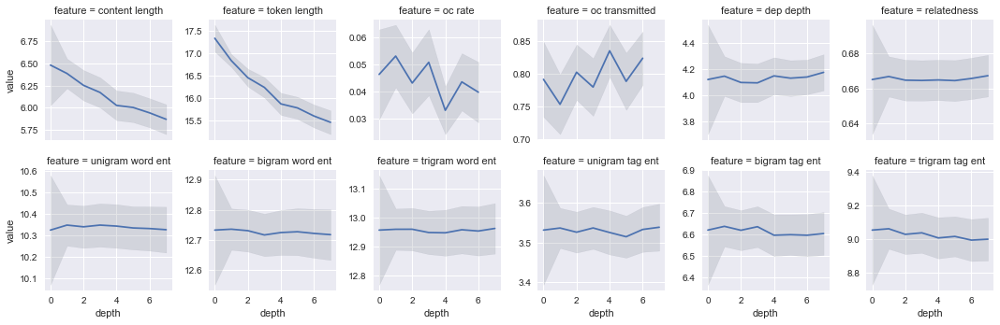

In [10]:
g = sb.FacetGrid(data=melted_data,
                 dropna=False, col='feature', col_order=length_features+features,
                 col_wrap=6, size=2.5, sharey=False)
g.map_dataframe(plot_feature_evolution, 'depth', 'value')

#### 2.2.2 Feature ~ depth * memorability of root

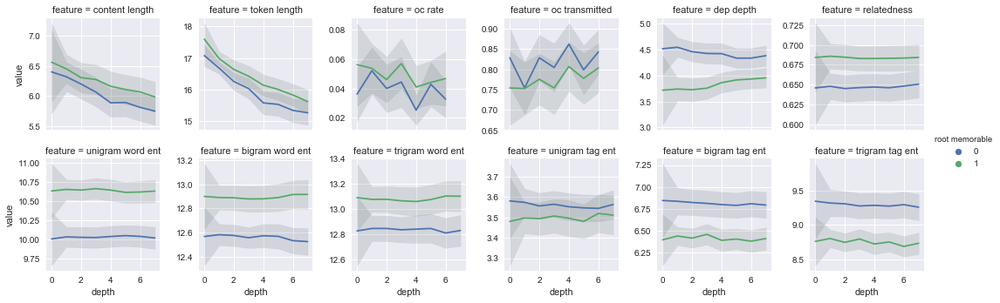

In [11]:
g = sb.FacetGrid(data=melted_data,
                 dropna=False, col='feature', col_order=length_features+features,
                 hue='root memorable',
                 col_wrap=6, size=2.5, sharey=False)
g.map_dataframe(plot_feature_evolution, 'depth', 'value').add_legend()

#### 2.2.3 Feature ~ depth, pre-averaged per tree

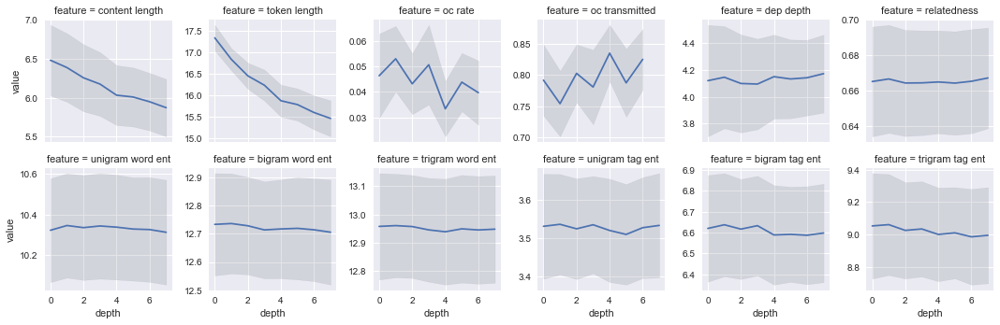

In [12]:
g = sb.FacetGrid(data=melted_data
                     .groupby(['tree id', 'depth', 'feature'], as_index=False)
                     ['tree id', 'depth', 'feature', 'value']
                     .mean(),
                 dropna=False, col='feature', col_order=length_features+features,
                 col_wrap=6, size=2.5, sharey=False)
g.map_dataframe(plot_feature_evolution, 'depth', 'value')

#### 2.2.4 Feature ~ depth * memorability of root, pre-averaged per tree

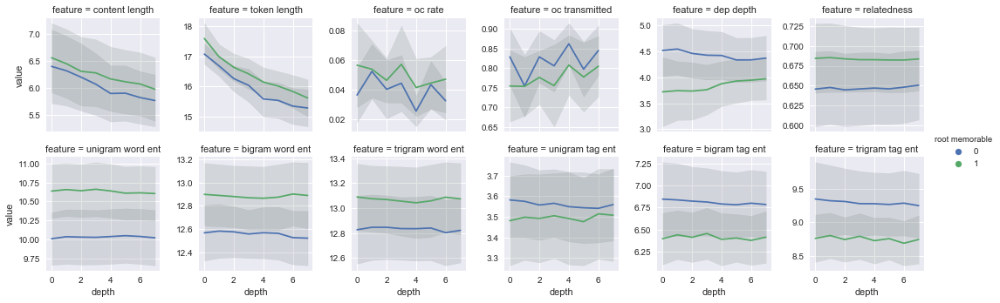

In [13]:
g = sb.FacetGrid(data=melted_data
                     .groupby(['tree id', 'depth', 'feature'], as_index=False)
                     ['tree id', 'depth', 'feature', 'value', 'root memorable']
                     .mean(),
                 dropna=False, col='feature', col_order=length_features+features,
                 hue='root memorable',
                 col_wrap=6, size=2.5, sharey=False)
g.map_dataframe(plot_feature_evolution, 'depth', 'value').add_legend()

#### 2.2.5 Feature ~ depth / tree

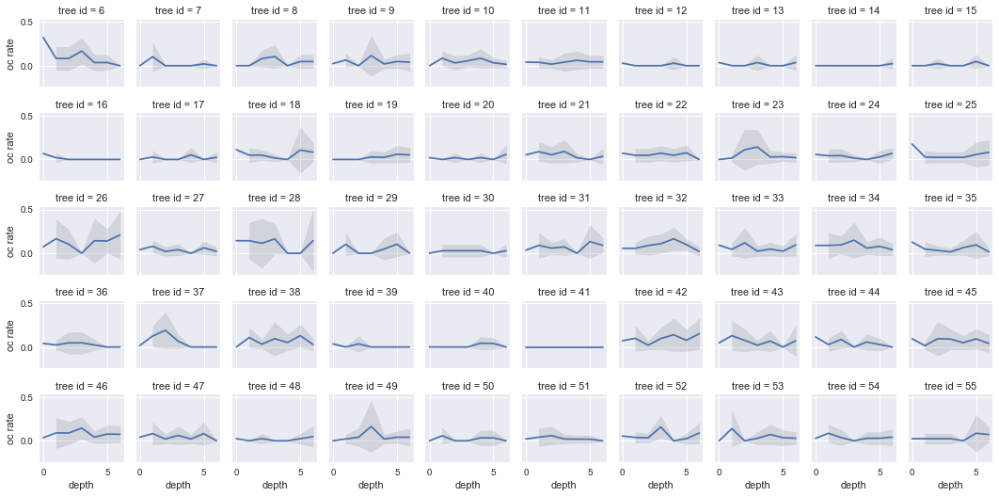

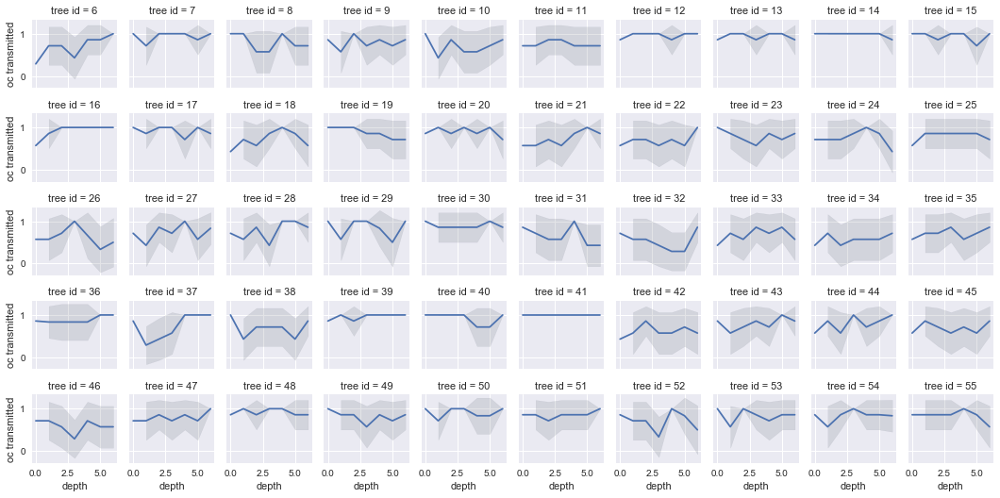

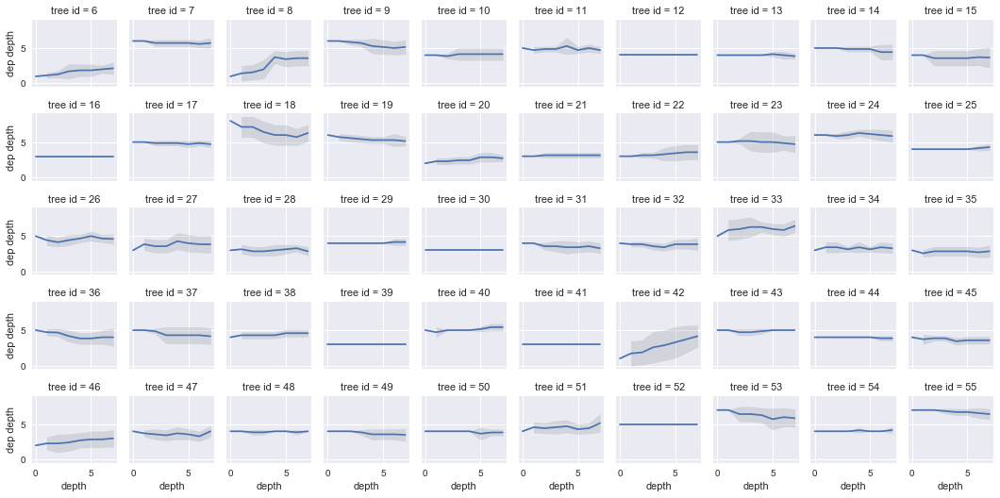

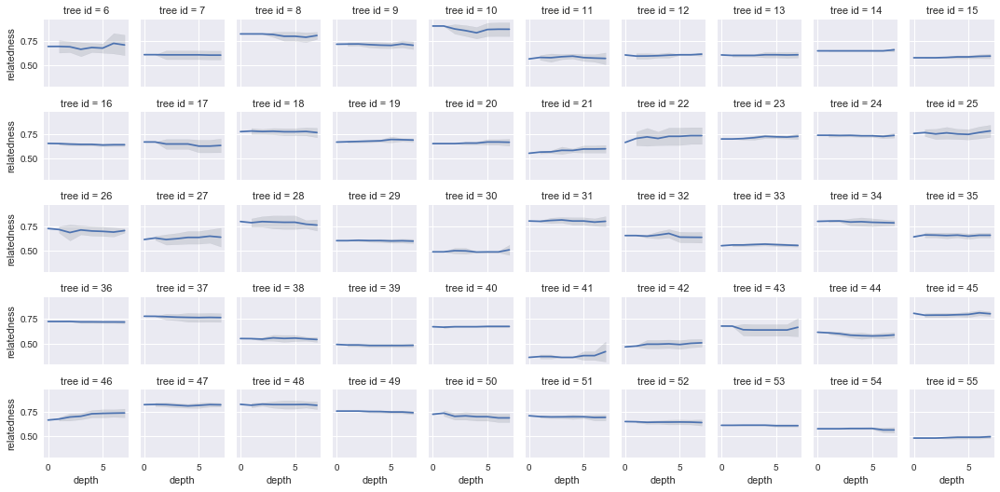

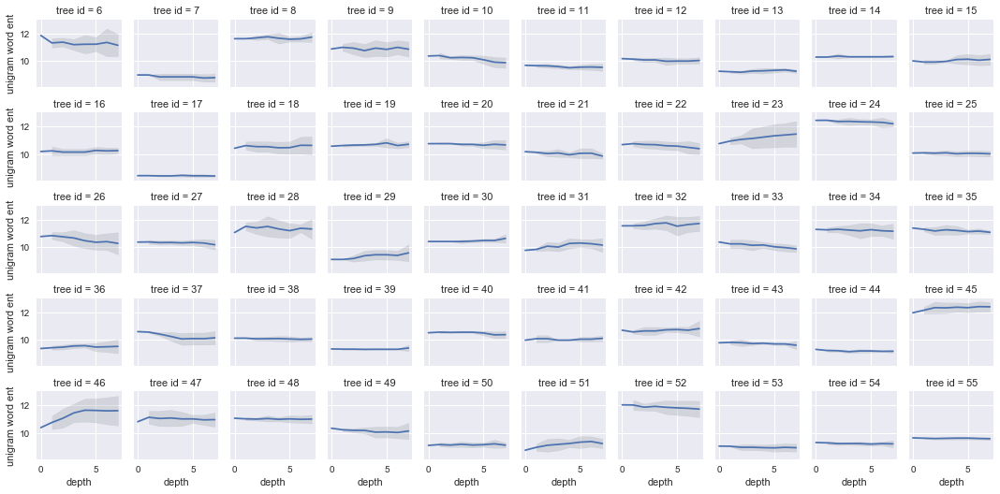

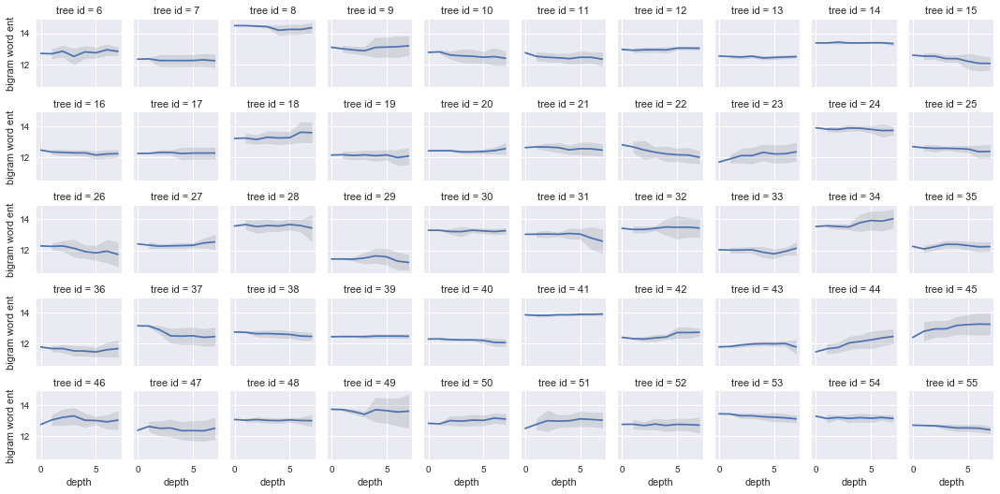

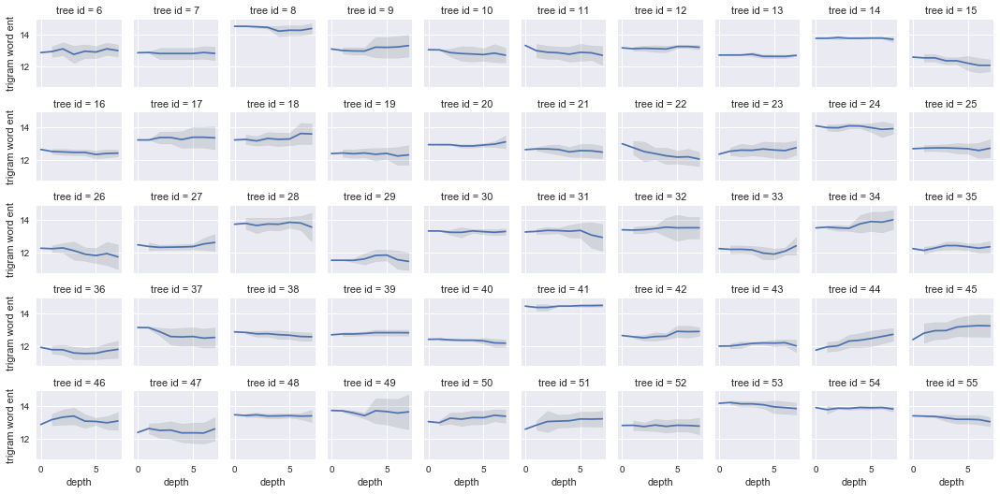

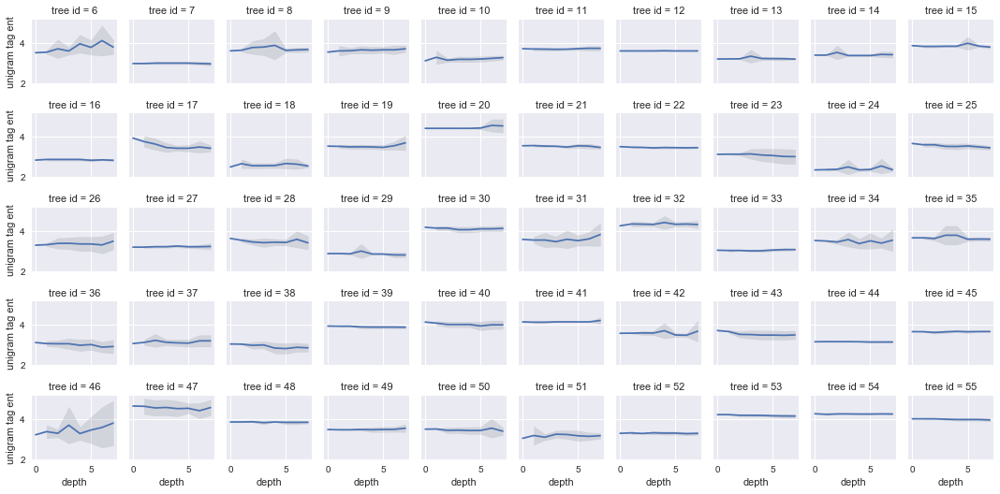

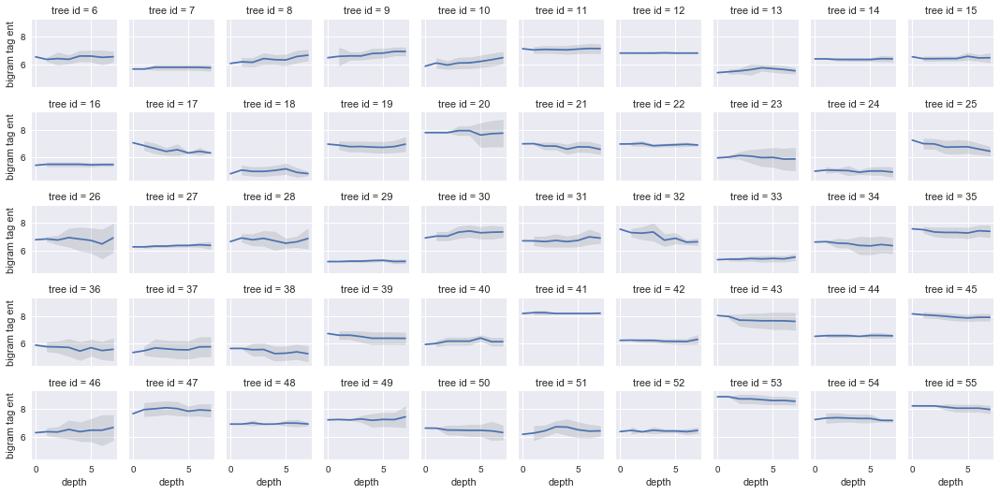

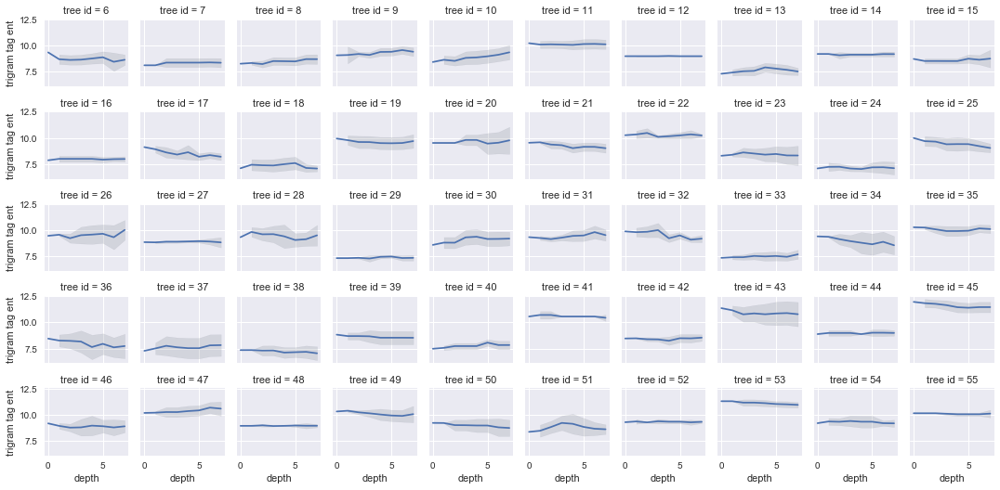

In [14]:
for feature in features:
    g = sb.FacetGrid(data=melted_data[melted_data.feature == feature],
                     dropna=False, col='tree id',
                     col_wrap=10, size=1.5)
    g.map_dataframe(plot_feature_evolution, 'depth', 'value')
    g.set_ylabels(feature)

#### 2.2.6 Feature ~ depth * branch / tree

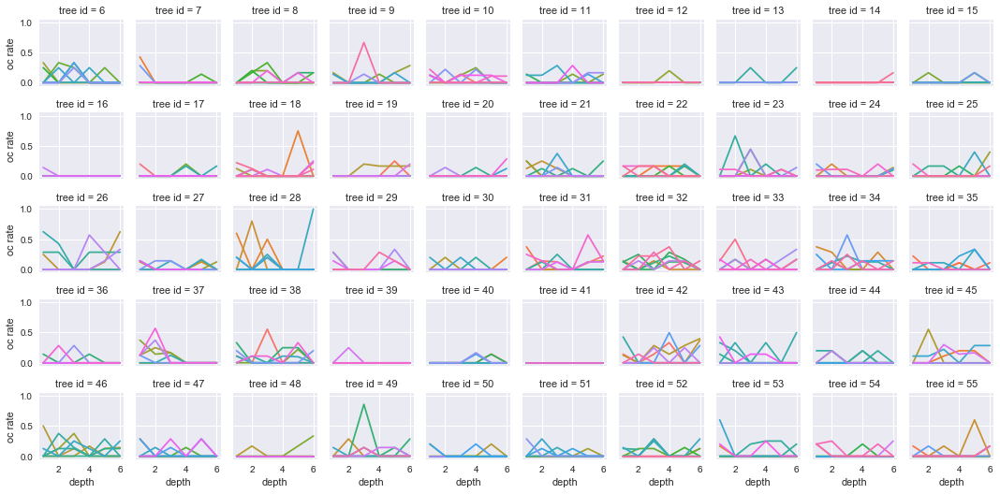

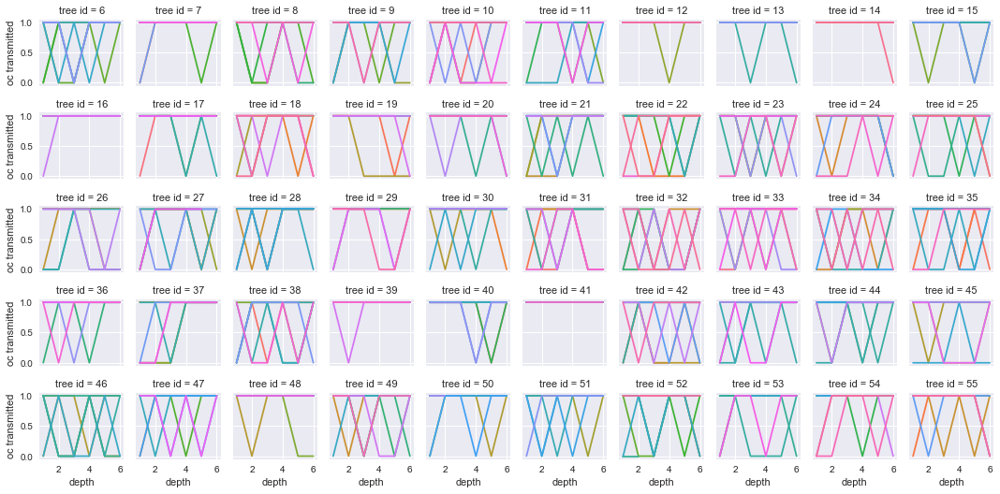

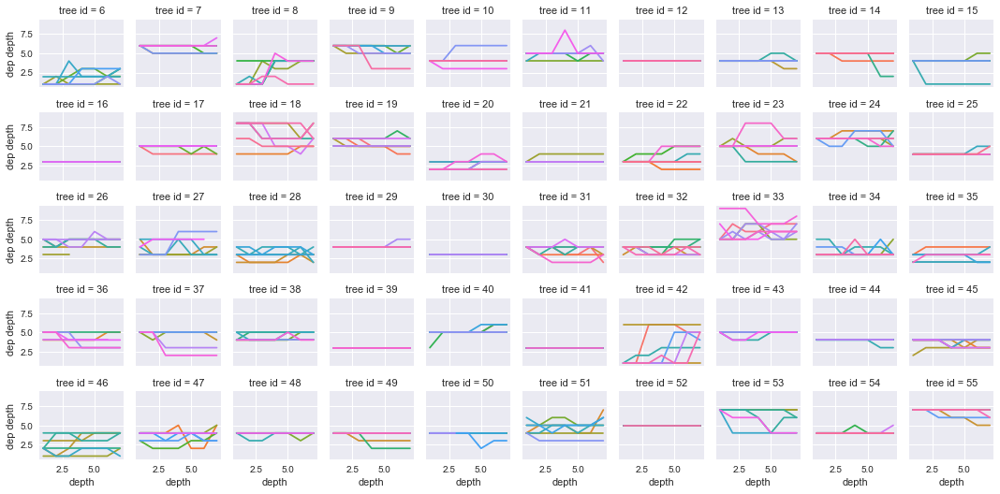

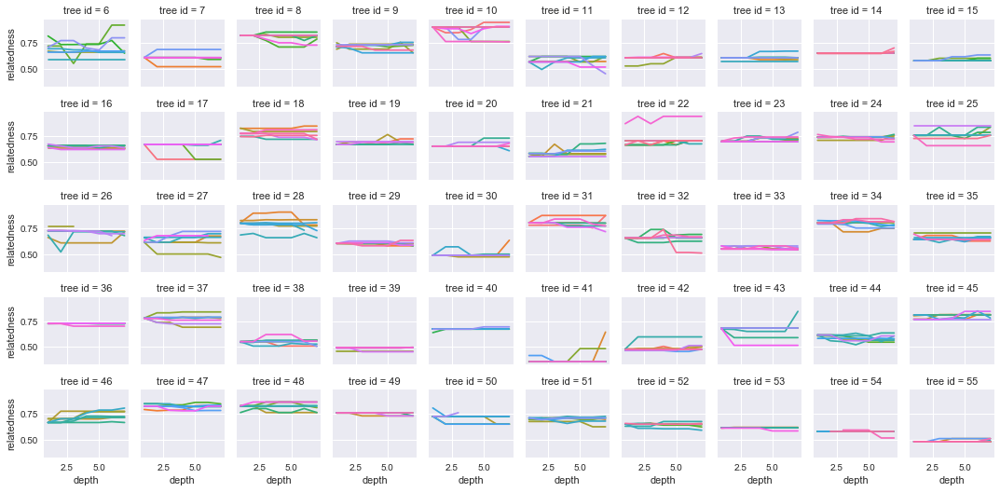

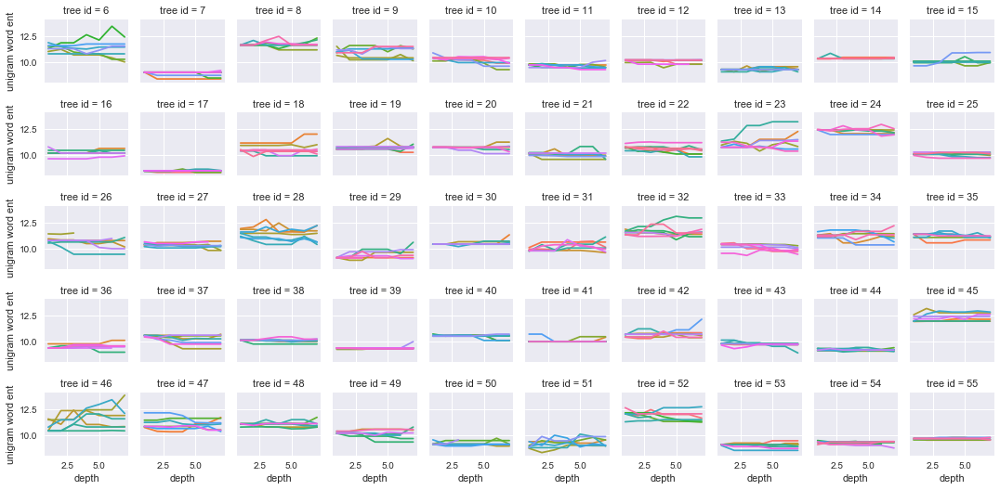

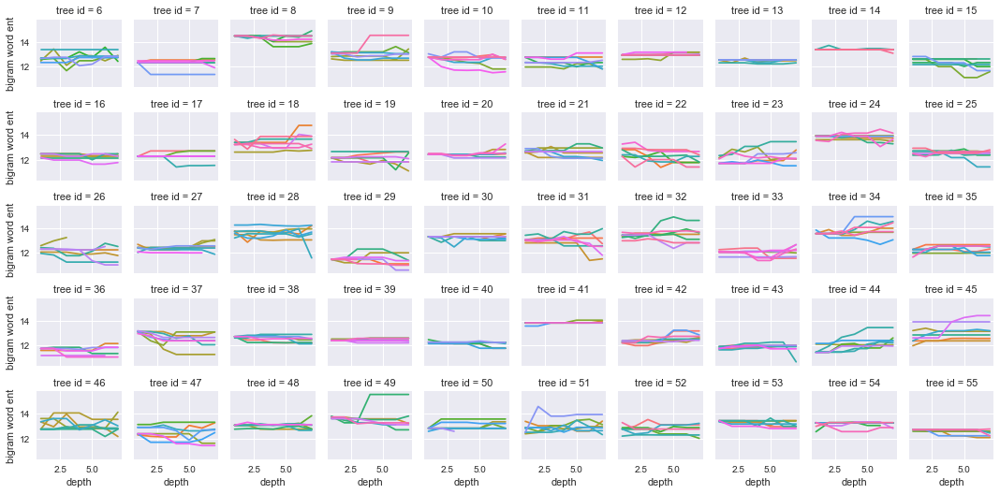

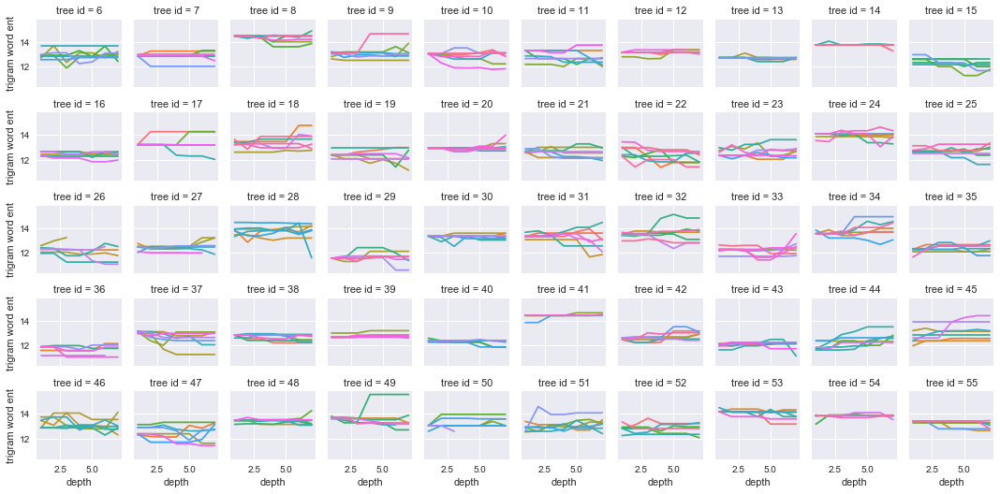

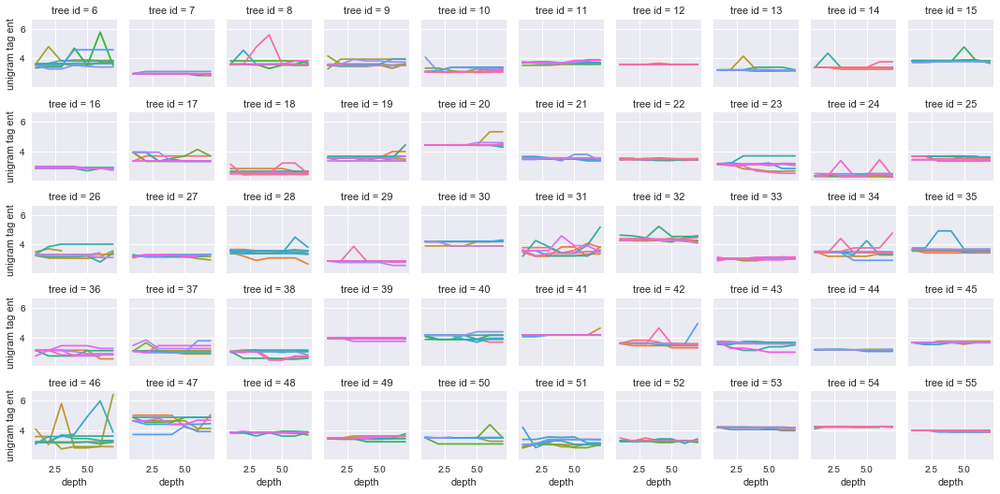

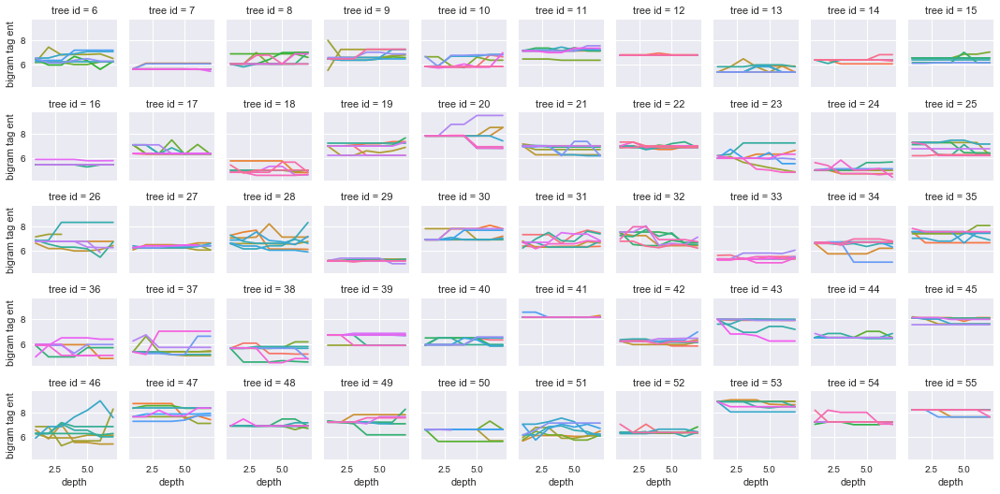

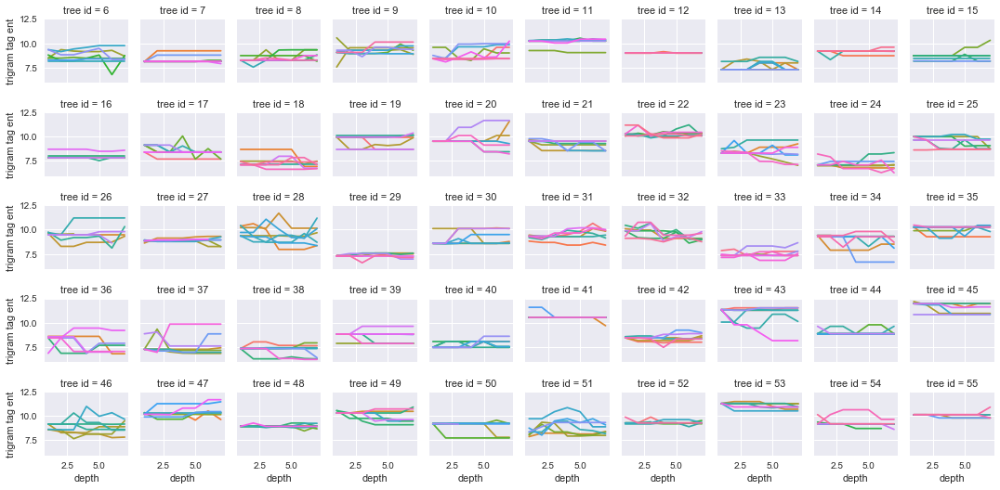

In [15]:
for feature in features:
    g = sb.FacetGrid(data=melted_data[melted_data.feature == feature],
                     dropna=False, col='tree id',
                     hue='branch id',
                     col_wrap=10, size=1.5)
    g.map_dataframe(plot_feature_evolution, 'depth', 'value')
    g.set_ylabels(feature)

#### 2.2.7 Feature ~ depth * branch / tree, with prettier trajectory plotting

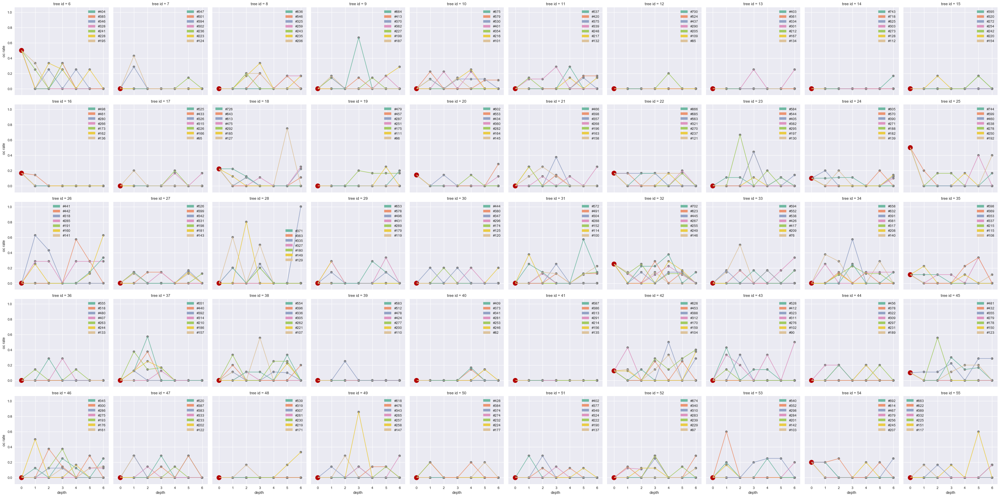

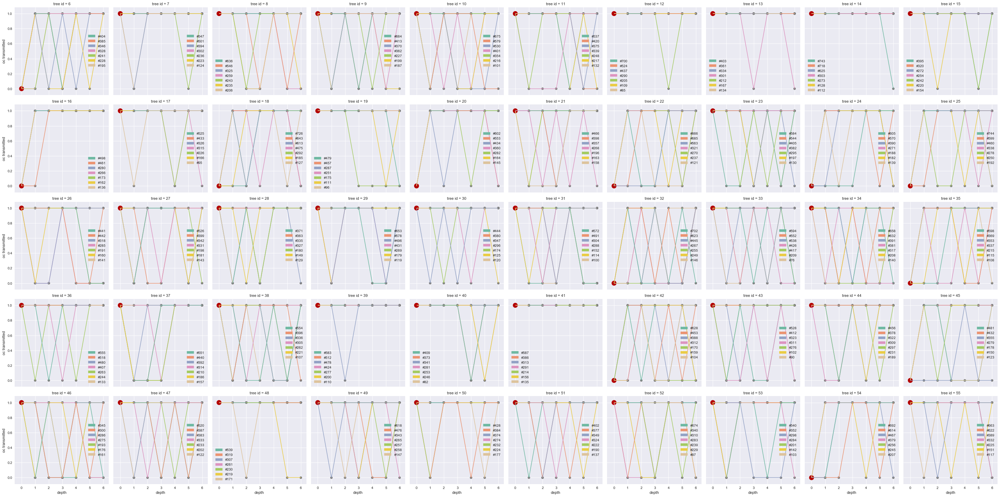

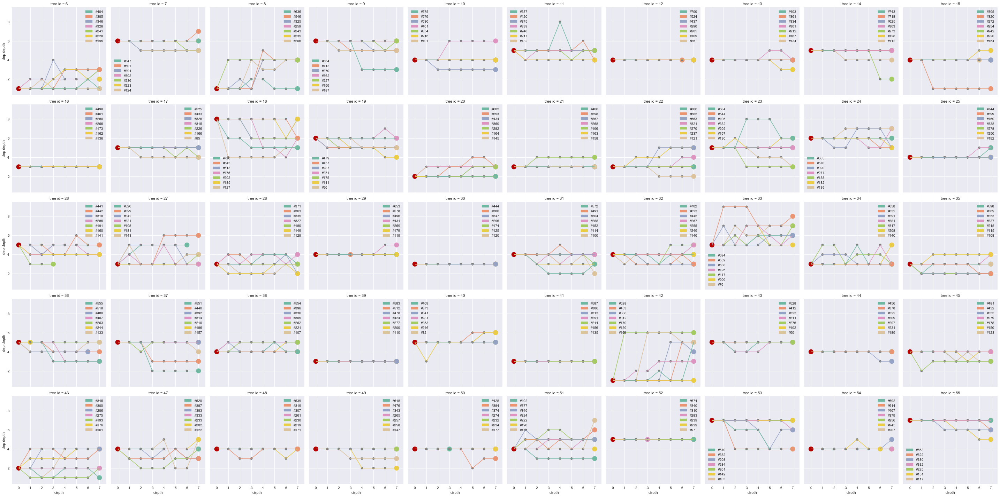

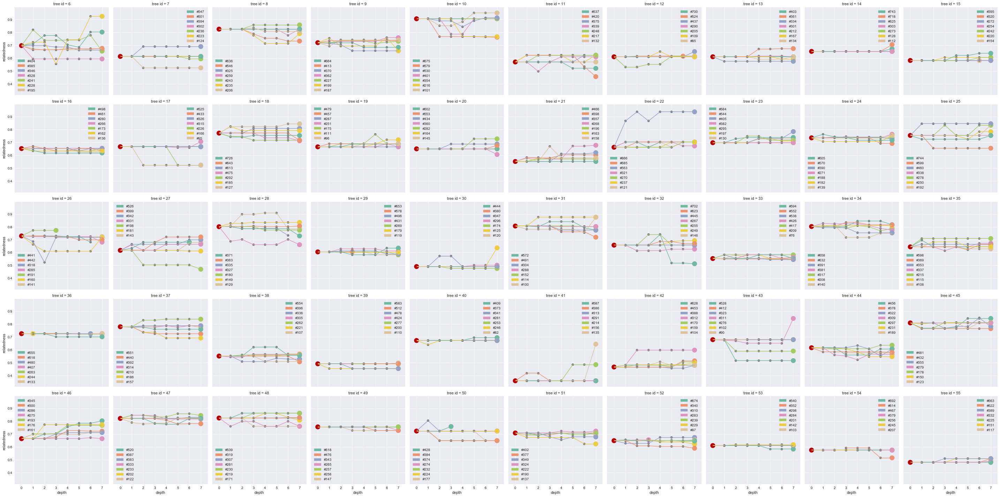

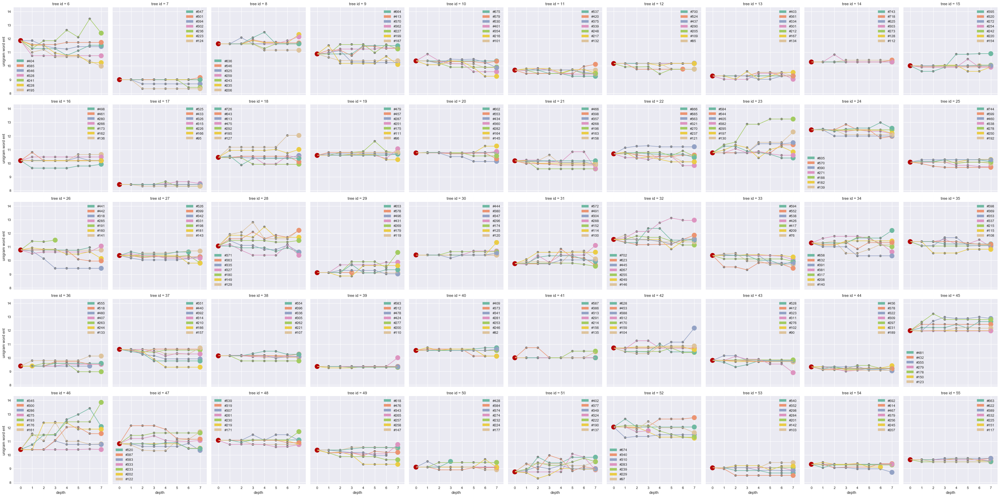

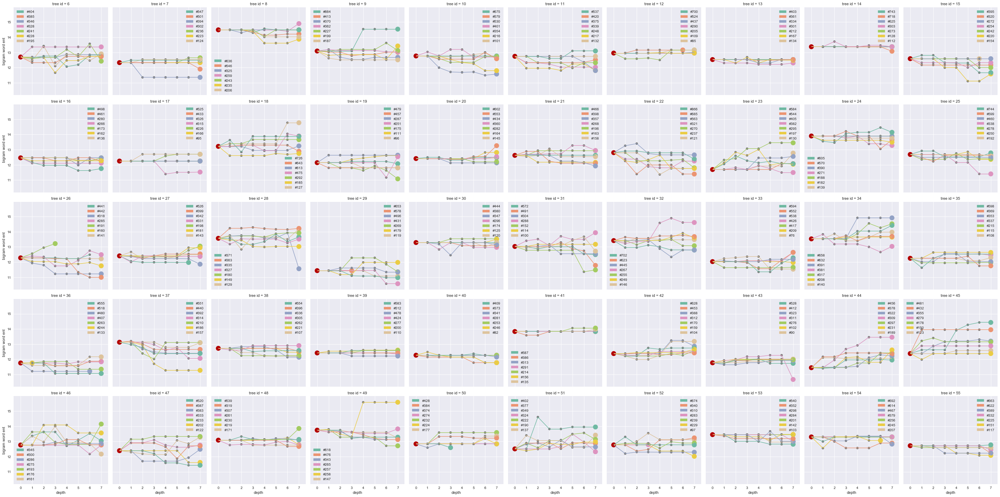

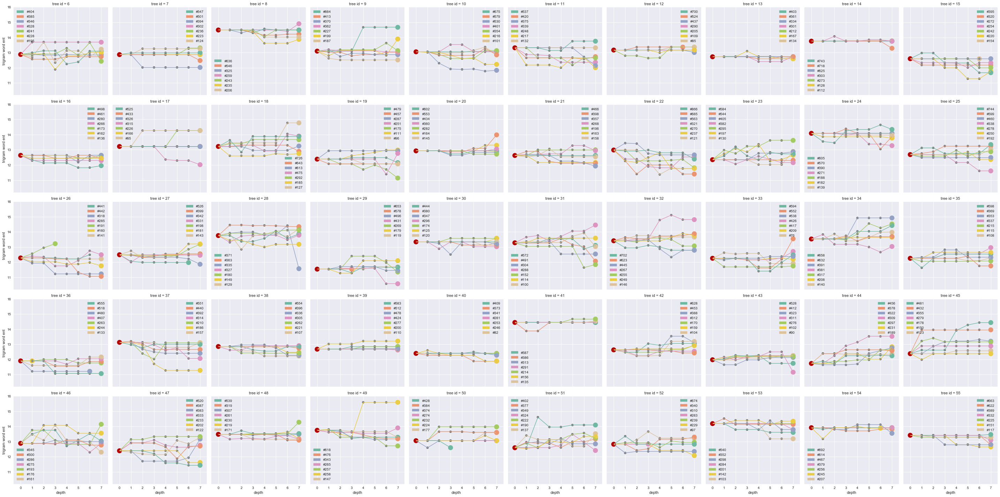

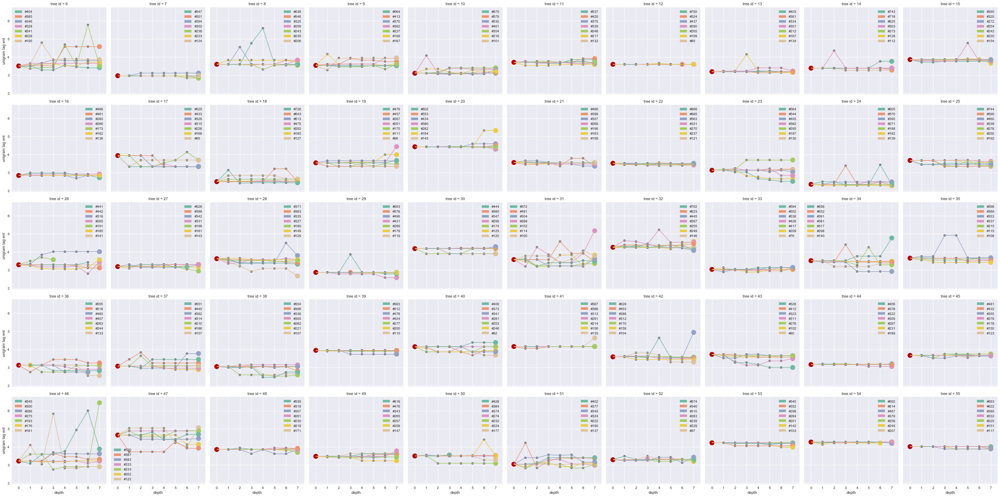

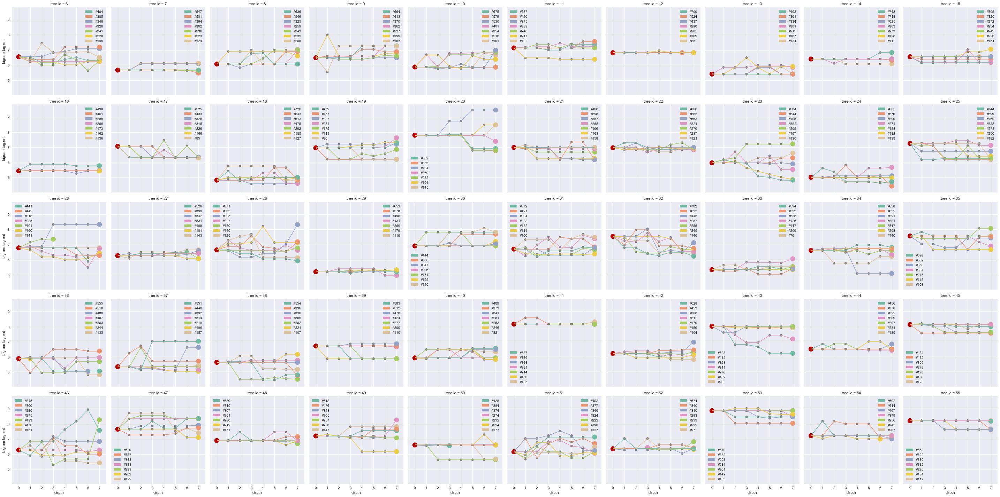

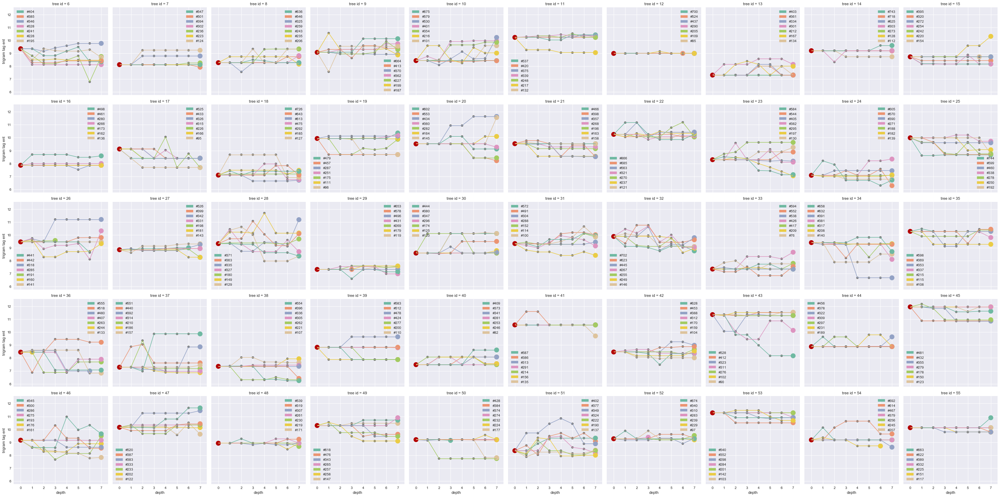

In [16]:
tree_ids = melted_data.groupby('sentence id')['tree id'].first()
for feature in features:
    legends = {}
    g = sb.FacetGrid(data=melted_data[melted_data.feature == feature]
                     .groupby('sentence id', as_index=False).first(),
                     dropna=False, col='tree id',
                     col_wrap=10, size=4)
    g.map_dataframe(plot_trajectories, 'depth', 'value', legends=legends)
    for i, ax in enumerate(g.axes):
        ax.legend(handles=legends[tree_ids.iloc[i]])
    g.set_ylabels(feature)

#### 2.2.8 Feature ~ depth / number of content words

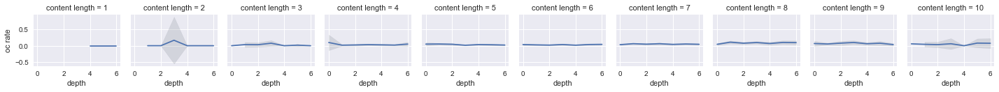

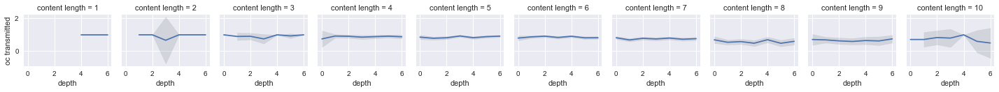

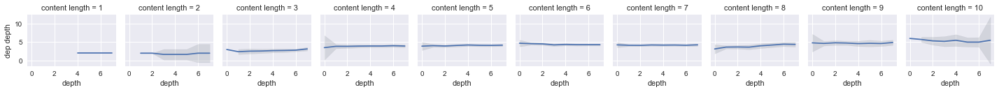

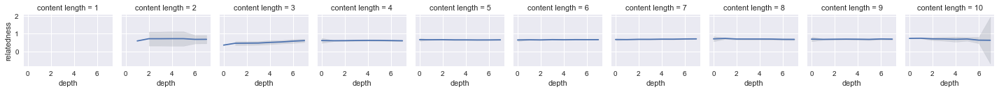

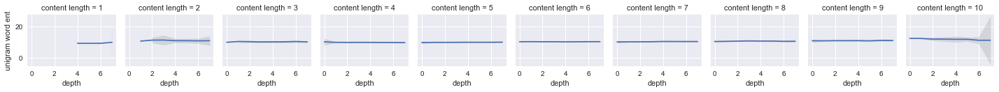

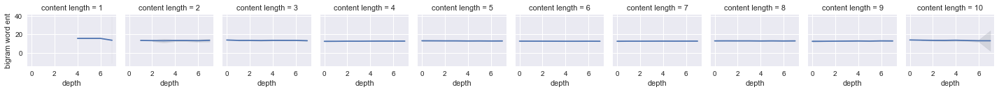

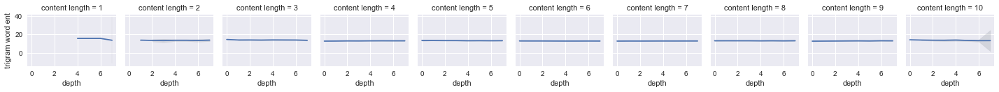

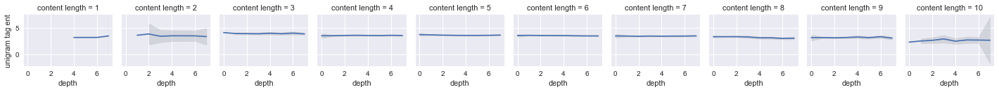

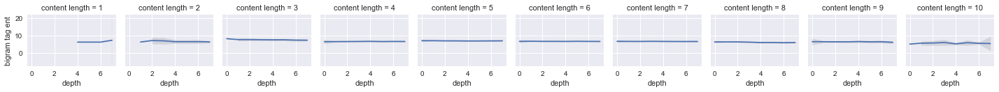

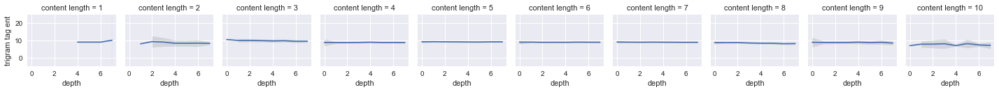

In [17]:
for feature in features:
    g = sb.FacetGrid(data=melted_data_lengths[melted_data_lengths.feature == feature],
                     dropna=False, col='content length',
                     col_wrap=10, size=2)
    g.map_dataframe(plot_feature_evolution, 'depth', 'value')
    g.set_ylabels(feature)

#### 2.2.9 Feature ~ depth * memorability of root / number of content words

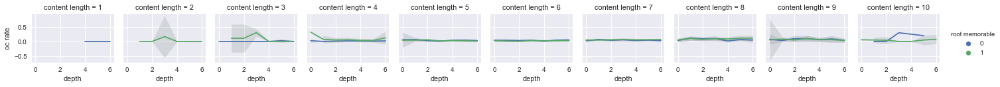

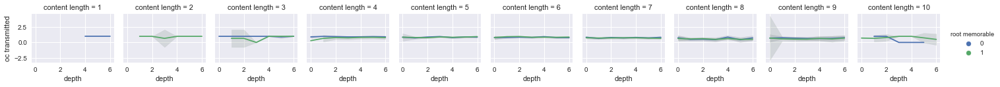

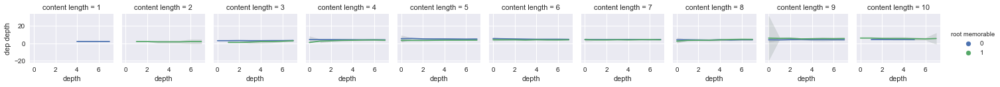

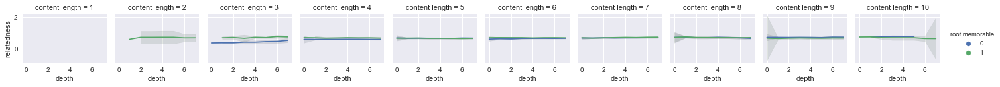

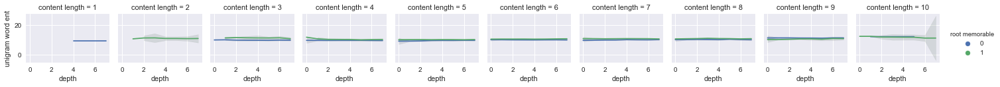

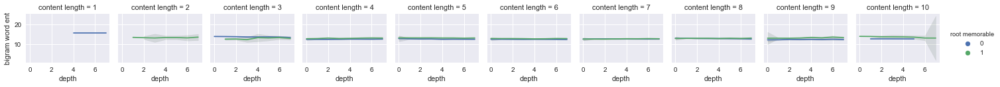

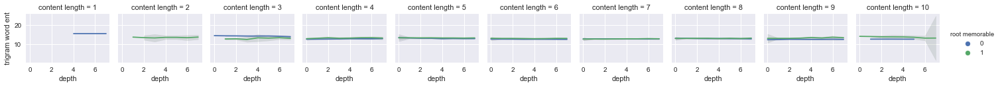

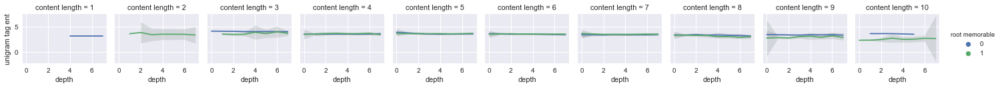

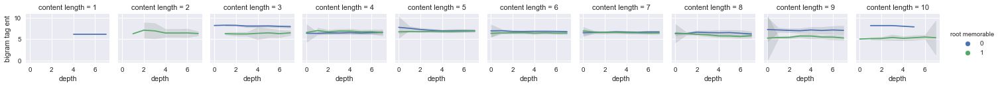

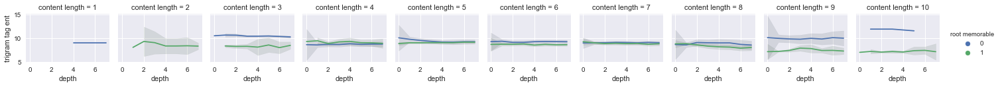

In [18]:
for feature in features:
    g = sb.FacetGrid(data=melted_data_lengths[melted_data_lengths.feature == feature],
                     dropna=False, col='content length',
                     hue='root memorable',
                     col_wrap=10, size=2)
    g.map_dataframe(plot_feature_evolution, 'depth', 'value').add_legend()
    g.set_ylabels(feature)

### 2.3 Feature distribution aggregating all depths

#### 2.3.1 Feature distribution (root sentences) * memorability of root

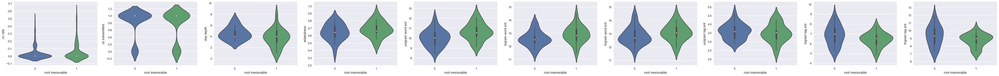

In [19]:
fig, axes = plt.subplots(1, len(features), figsize=(6 * len(features), 4))
for i, feature in enumerate(features):
    ids = melted_data_lengths['is root'] & (melted_data_lengths.feature == feature)
    # Use a violinplot in a for loop, instead of a factorplot/FacetGrid,
    # since the behaviour for repeated measures is different according to the feature
    sb.violinplot(ax=axes[i], y='value', x='root memorable',
                  data=(melted_data_lengths[ids]
                        if ('rate' in feature) or ('transmitted' in feature)
                        # For non transmission-related features, remove repeated measures
                        else melted_data_lengths[ids].groupby('sentence id').first()),
                  size=3)
    axes[i].set_ylabel(feature)

#### 2.3.2 Feature distribution (root sentences) * memorability of root / number of content words

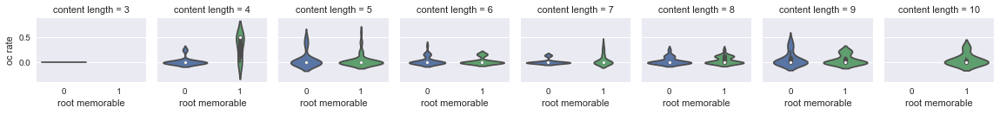

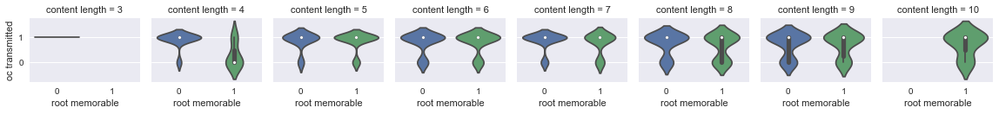

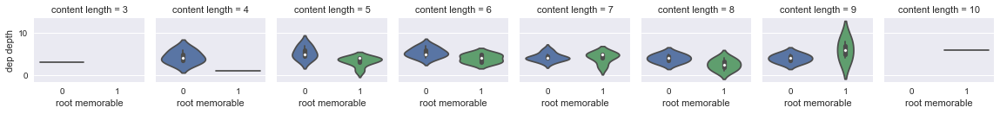

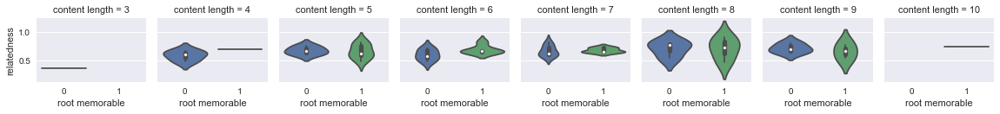

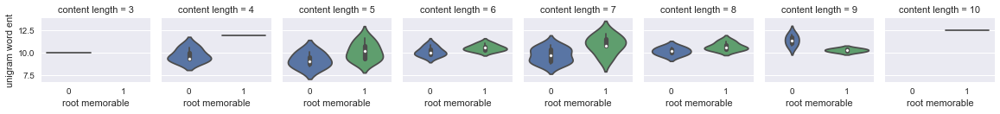

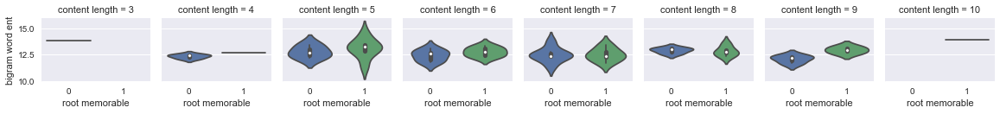

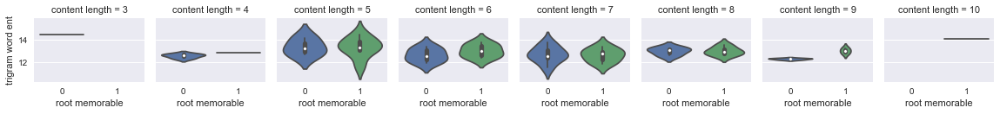

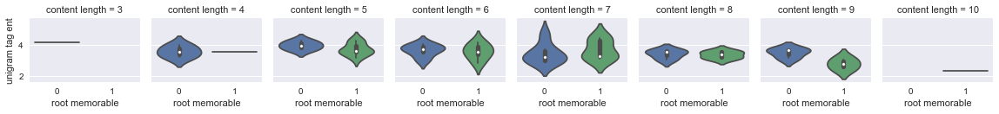

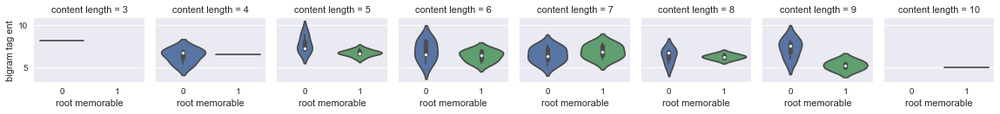

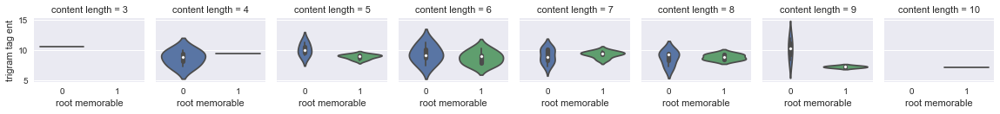

In [20]:
for feature in features:
    ids = melted_data_lengths['is root'] & (melted_data_lengths.feature == feature)
    g = sb.factorplot(y='value', x='root memorable',
                      data=(melted_data_lengths[ids]
                            if ('rate' in feature) or ('transmitted' in feature)
                            # For non transmission-related features, remove repeated measures
                            else melted_data_lengths[ids].groupby('sentence id').first()),
                      kind='violin',
                      col='content length', col_wrap=10,
                      size=2)
    g.set_ylabels(feature)

#### 2.3.3 Feature distribution (all sentences) * content words perfectly transmitted or not

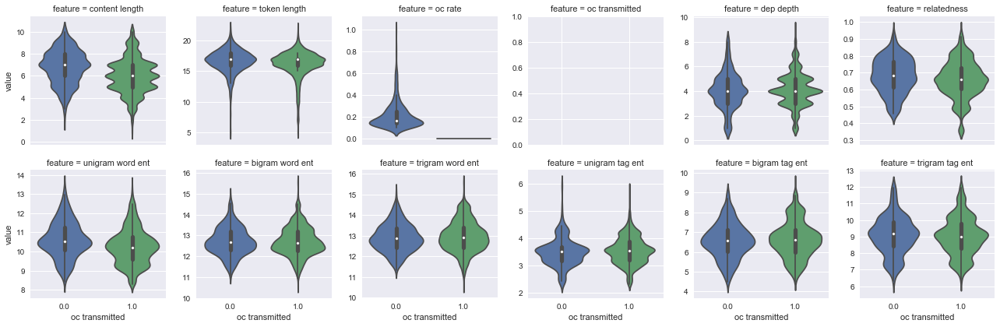

In [21]:
sb.factorplot(y='value', x='oc transmitted',
              data=melted_data_transmitted,
              col='feature', col_wrap=6, col_order=length_features+features,
              sharey=False,
              kind='violin', size=3)

#### 2.3.4 Feature distribution (all sentences) * content words perfectly transmitted or not, pre-averaged per tree

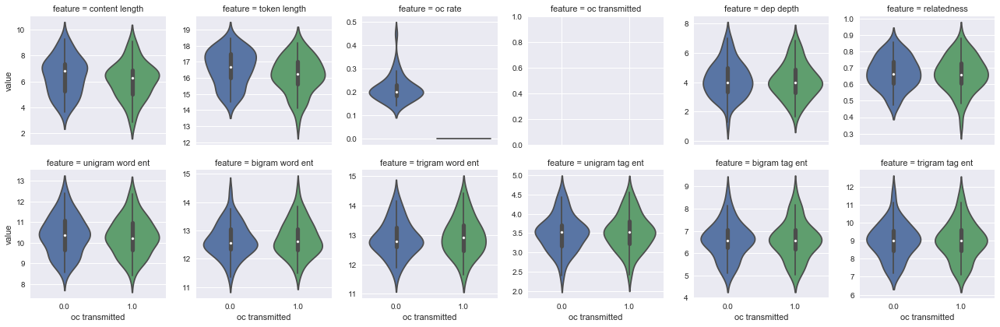

In [22]:
sb.factorplot(y='value', x='oc transmitted',
              data=melted_data_transmitted
              .groupby(['tree id', 'oc transmitted', 'feature'], as_index=False)
                     ['tree id', 'oc transmitted', 'feature', 'value']
                     .mean(),
              col='feature', col_wrap=6, col_order=length_features+features,
              sharey=False,
              kind='violin', size=3)

#### 2.3.5 Feature distribution (all sentences) * content words perfectly transmitted or not / number of content words

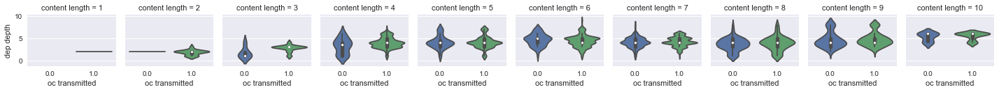

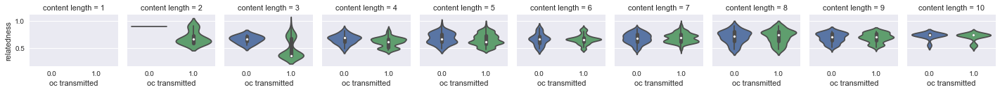

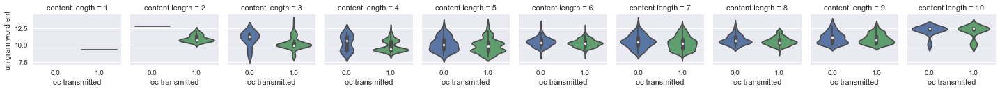

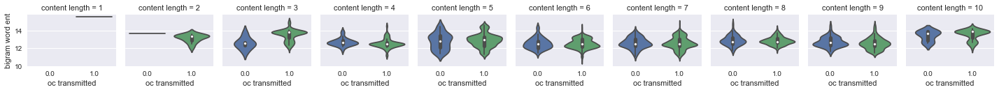

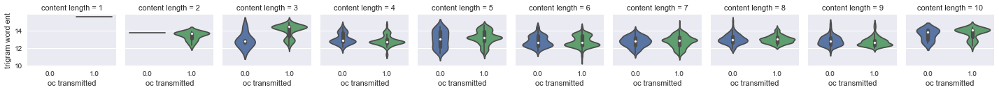

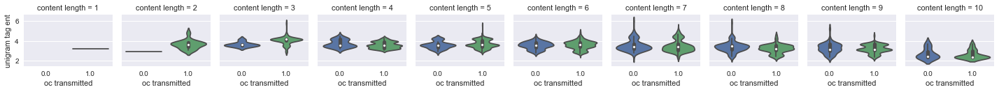

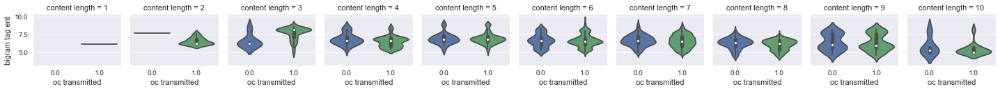

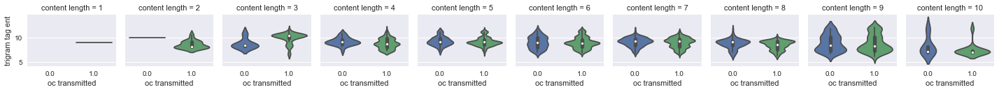

In [23]:
for feature in features:
    if 'transmitted' in feature or 'rate' in feature:
        continue
    g = sb.factorplot(y='value', x='oc transmitted',
                      data=melted_data_transmitted_lengths\
                           [melted_data_transmitted_lengths.feature == feature],
                      col='content length', col_wrap=10,
                      kind='violin', size=2)
    g.set_ylabels(feature)

#### 2.3.6 Feature distribution (all sentences) * content words perfectly transmitted or not / tree

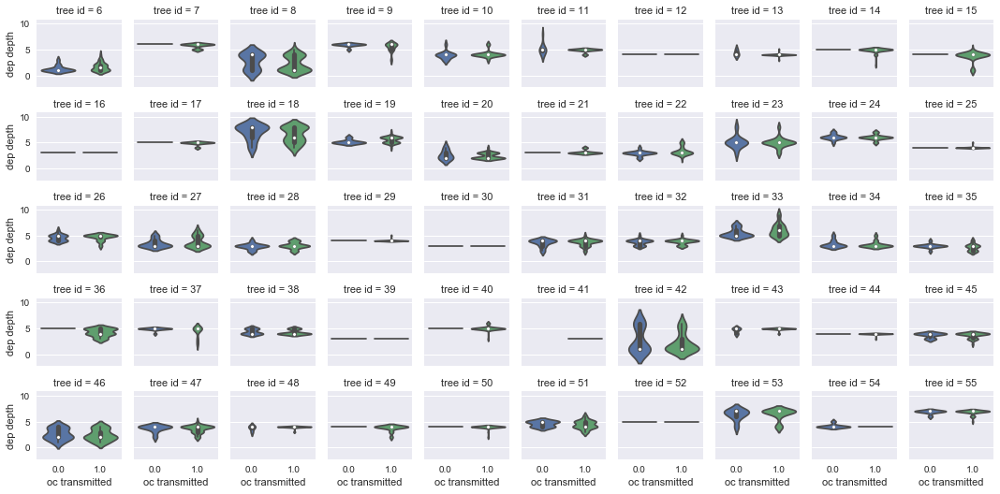

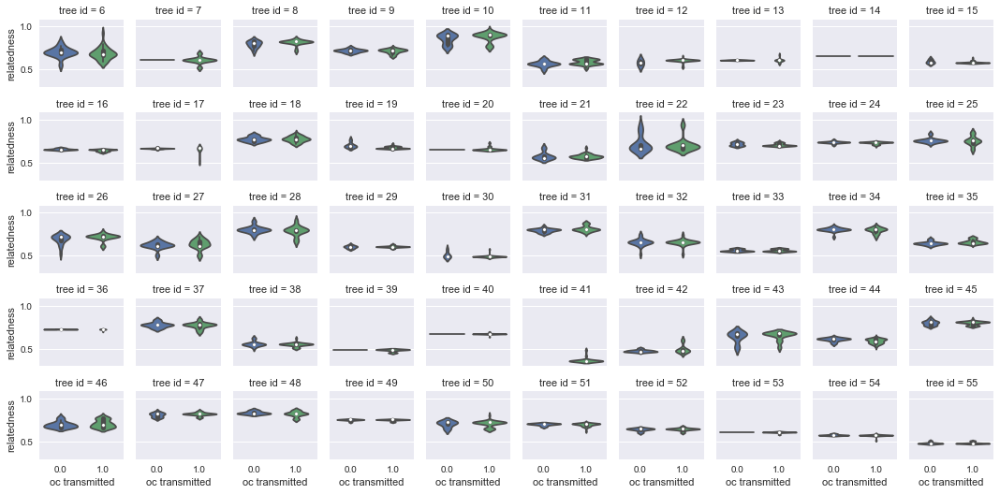

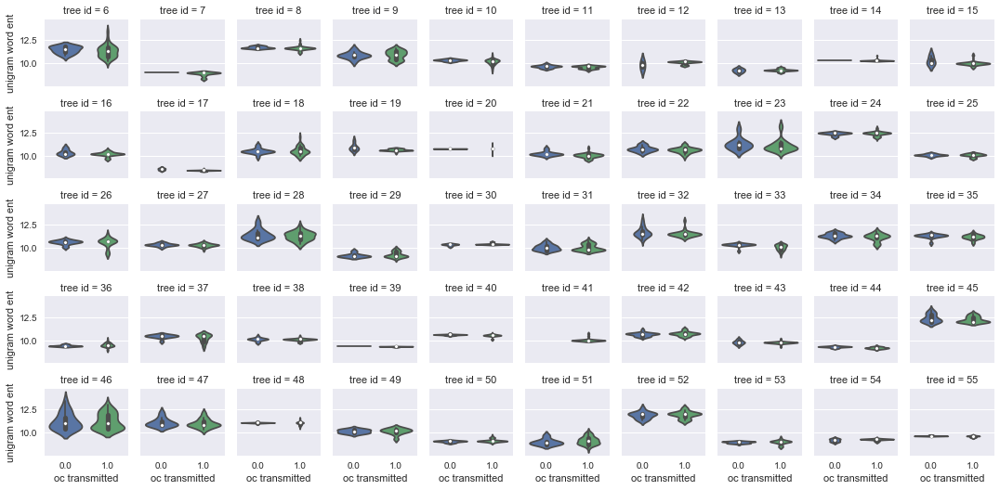

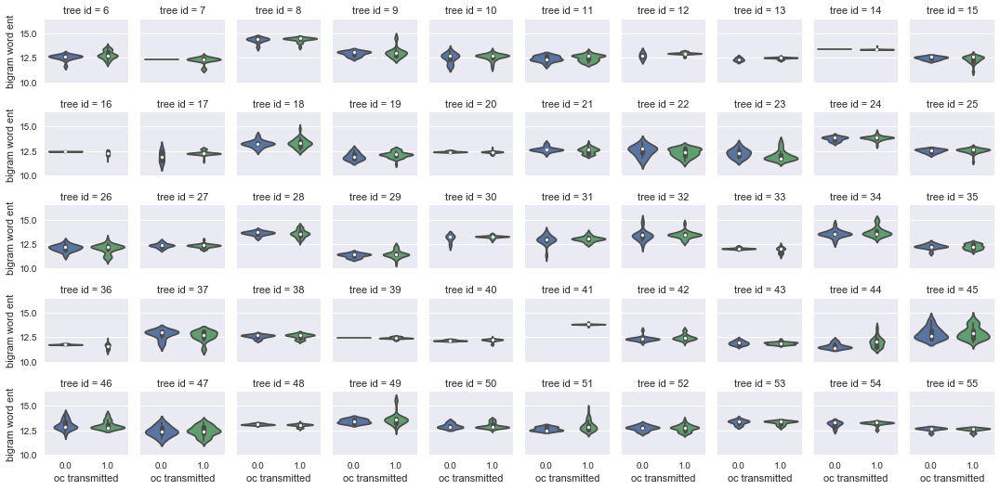

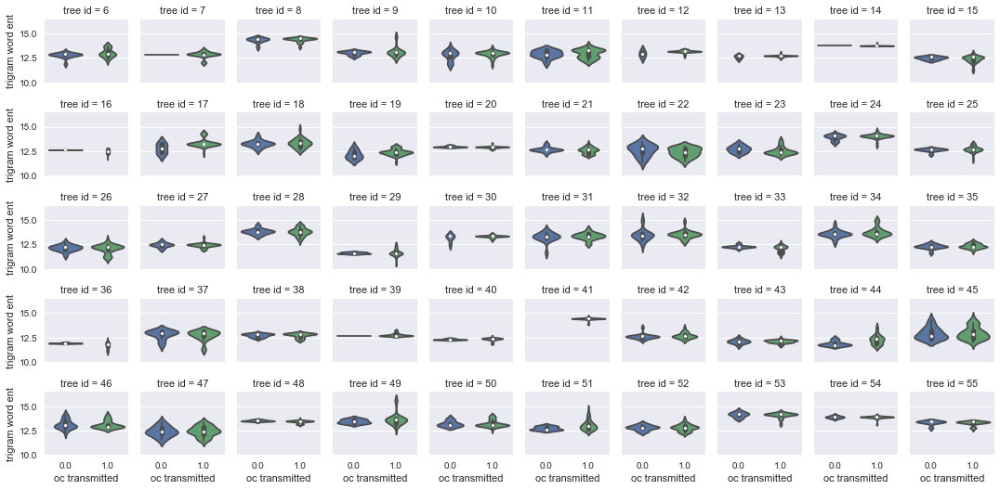

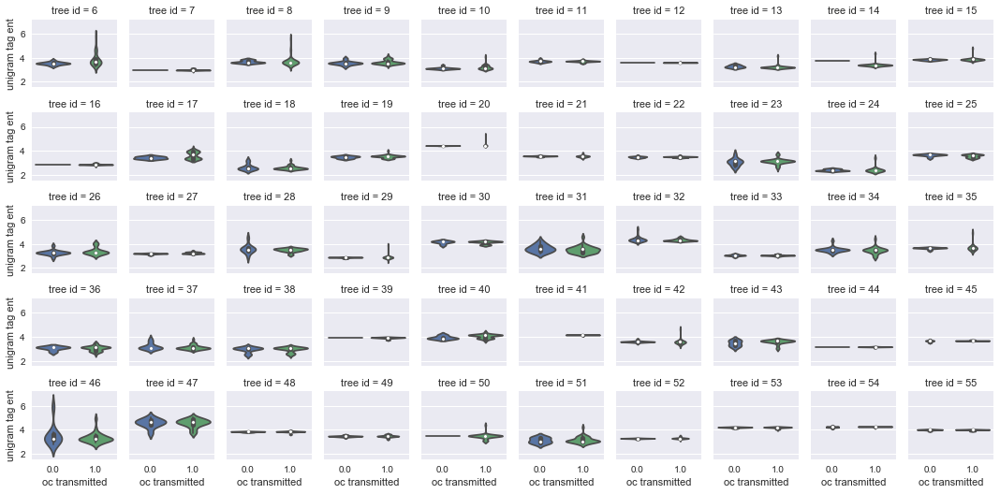

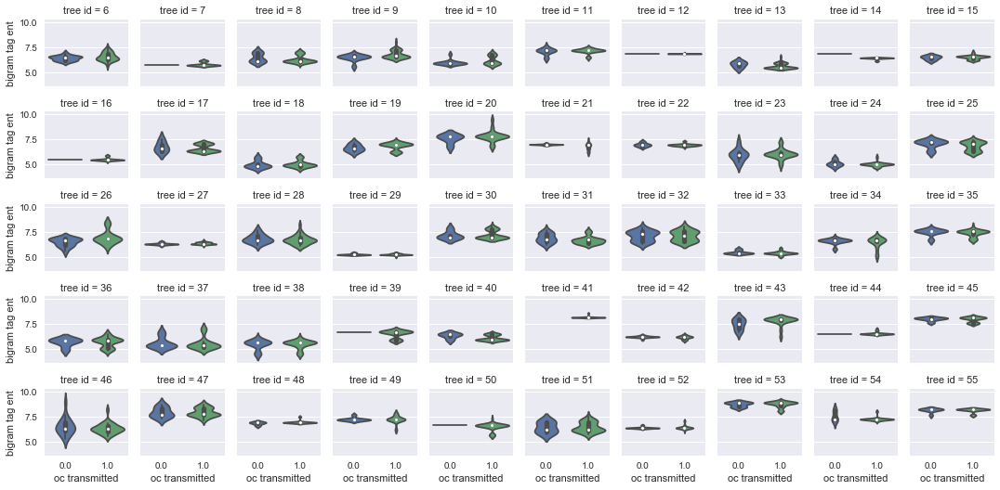

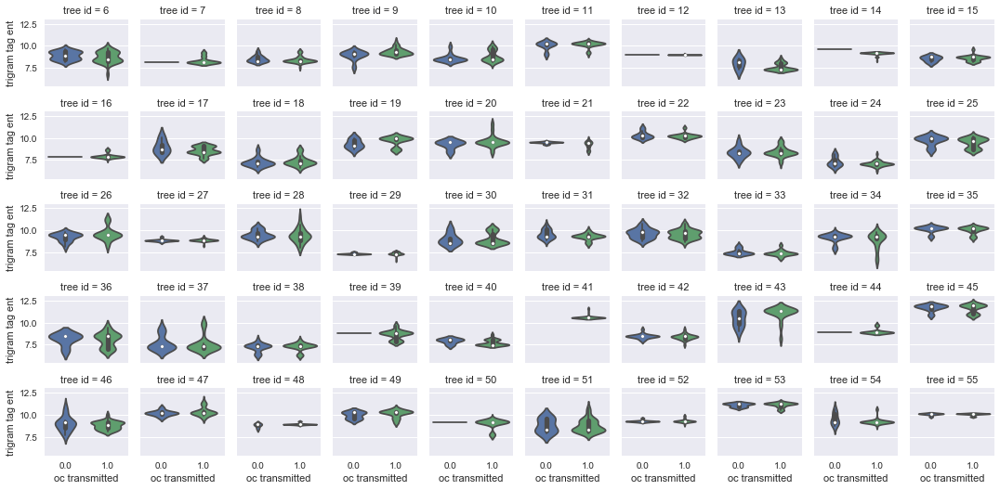

In [24]:
for feature in features:
    if 'transmitted' in feature or 'rate' in feature:
        continue
    g = sb.factorplot(y='value', x='oc transmitted',
                      data=melted_data_transmitted_lengths\
                           [melted_data_transmitted_lengths.feature == feature],
                      col='tree id', col_wrap=10,
                      kind='violin', size=1.5)
    g.set_ylabels(feature)

Note: to implement variability graphs (i.e. plotting std of a value across branches, at a given depth, to quantify the average distance between branches), we need CIs on the standard deviation, to be implemented following [Bonnet (2006)](https://pdfs.semanticscholar.org/2488/129d6d00cd42361cf30f03e1abae3ac717de.pdf) ([Cho, Cho, & Eltinge (2005)](http://www.ijpam.eu/contents/2005-21-3/10/10.pdf) might also be useful). It's not trivial, so I won't be doing it soon.

## 3 Sentence feature step-change

### 3.1 Setup

Build the master DataFrame that we'll plot below

In [25]:
data = []
for tree in Tree.objects.experiment:
    for sentence in tree.sentences.kept:
        sentence_depth = sentence.depth
        if sentence_depth > config.target_branch_depth:
            # Ignore out-of-shape sentences
            continue
        doc = nlp(sentence.text)
        children = sentence.children.kept
        doc_dep_depth = dep_depth(doc)
        content_length = len(sentence.content_words)
        token_length = len(doc)
        unigram_word_ent = score_ngram(1, 'word', doc)
        bigram_word_ent = score_ngram(2, 'word', doc)
        trigram_word_ent = score_ngram(3, 'word', doc)
        unigram_tag_ent = score_ngram(1, 'tag', doc)
        bigram_tag_ent = score_ngram(2, 'tag', doc)
        trigram_tag_ent = score_ngram(3, 'tag', doc)
        for child in children:
            if child.depth > config.target_branch_depth:
                continue
            oc_rate = sentence.ordered_content_distance(child)
            child_doc = nlp(child.text)
            child_unigram_word_ent = score_ngram(1, 'word', child_doc)
            child_bigram_word_ent = score_ngram(2, 'word', child_doc)
            child_trigram_word_ent = score_ngram(3, 'word', child_doc)
            child_unigram_tag_ent = score_ngram(1, 'tag', child_doc)
            child_bigram_tag_ent = score_ngram(2, 'tag', child_doc)
            child_trigram_tag_ent = score_ngram(3, 'tag', child_doc)
            data.append({
                'tree id': tree.id,
                'branch id': child.head.id,
                'parent depth': sentence_depth,
                'root memorable': int(tree.id % 2 == 0),
                'oc transmitted': int(oc_rate == 0),

                'parent id': sentence.id,
                'parent dep depth': doc_dep_depth,
                'parent content length': content_length,
                'parent token length': token_length,
                'parent relatedness': relatedness(doc),
                'parent unigram word ent': unigram_word_ent,
                'parent bigram word ent': bigram_word_ent,
                'parent trigram word ent': trigram_word_ent,
                'parent unigram tag ent': unigram_tag_ent,
                'parent bigram tag ent': bigram_tag_ent,
                'parent trigram tag ent': trigram_tag_ent,

                'child id': child.id,
                'child dep depth': dep_depth(child_doc),
                'child content length': len(child.content_words),
                'child token length': len(child_doc),
                'child relatedness': relatedness(child_doc),
                'child unigram word ent': child_unigram_word_ent,
                'child bigram word ent': child_bigram_word_ent,
                'child trigram word ent': child_trigram_word_ent,
                'child unigram tag ent': child_unigram_tag_ent,
                'child bigram tag ent': child_bigram_tag_ent,
                'child trigram tag ent': child_trigram_tag_ent,
            })

features = ['dep depth', 'relatedness',
            'unigram word ent', 'bigram word ent', 'trigram word ent',
            'unigram tag ent', 'bigram tag ent', 'trigram tag ent']
continuous_features = ['relatedness',
                       'unigram word ent', 'bigram word ent', 'trigram word ent',
                       'unigram tag ent', 'bigram tag ent', 'trigram tag ent']
length_features = ['content length', 'token length']
data = pd.DataFrame(data)

/home/sl/.virtualenvs/interpretation-experiment.analysis/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2889: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)

/home/sl/.virtualenvs/interpretation-experiment.analysis/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)



And add a variation-plotting function used below

In [26]:
def plot_variation(**kwargs):
    data = kwargs.pop('data')
    ax = kwargs.get('ax', plt.gca())
    color = kwargs.get('color', sb.color_palette()[0])
    feature = kwargs['feature']
    binning = kwargs.get('binning')
    x = data['parent ' + feature]
    y = data['child ' + feature]
    
    # Compute binning.
    if binning is not None:
        for bin_count in range(binning, 0, -1):
            try:
                x_bins, bins = pd.cut(x, bin_count, labels=False,
                                      retbins=True, right=False)
                break
            except ValueError:
                pass
        if bin_count <= 1:
            return
        middles = (bins[:-1] + bins[1:]) / 2
    else:
        middles = np.arange(x.values.min(), x.values.max() + 1)
        x_bins = x.values - x.values.min()
        bin_count = len(middles)
    
    # Compute bin values.
    values = np.zeros(bin_count)
    cis = np.zeros(bin_count)
    for i in range(bin_count):
        indices = x_bins == i
        n = indices.sum()
        values[i] = y[indices].mean()
        cis[i] = (stats.t.ppf(1 - 0.5/2, n - 1) * y[indices].std(ddof=1)
                  / np.sqrt(n))
    
    # Plot.
    ax.plot(middles, values, '-', lw=2, color=color)
    ax.fill_between(middles, values - cis, values + cis,
                    color=sb.desaturate(color, 0.2), alpha=0.2)
    ax.plot(middles, middles, linestyle='dotted',
            color=sb.desaturate(color, 0.2))

### 3.2 Parent feature ~ child feature

### 3.2.1 Parent feature ~ child feature

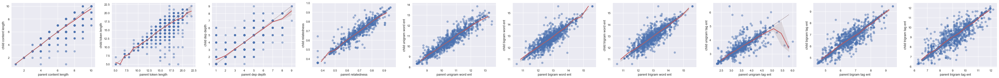

In [32]:
fig, axes = plt.subplots(1, len(features + length_features),
                         figsize=(6 * len(features + length_features), 4))
for i, feature in enumerate(length_features+features):
    axes[i].scatter(data['parent ' + feature], data['child ' + feature],
                    color=sb.color_palette()[0] + (0.5,))
    plot_variation(data=data, feature=feature, ax=axes[i], color=sb.color_palette()[2],
                   binning=10 if feature in continuous_features else None)
    axes[i].set_xlabel('parent ' + feature)
    axes[i].set_ylabel('child ' + feature)

### 3.2.2 Parent feature ~ child feature / parent depth in tree

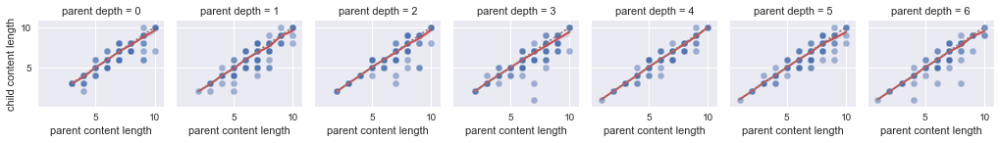

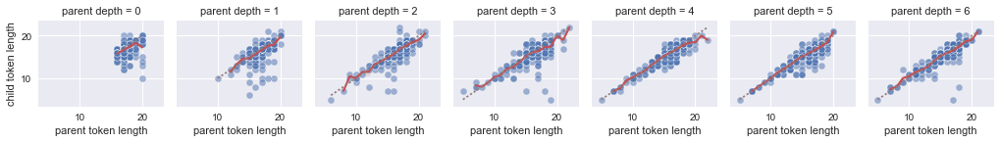

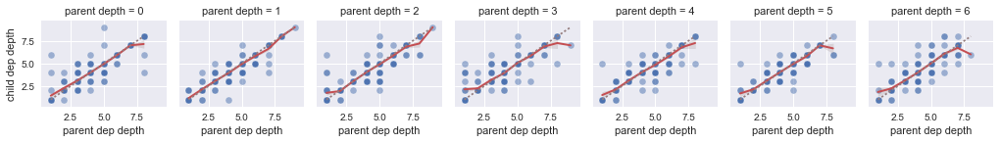

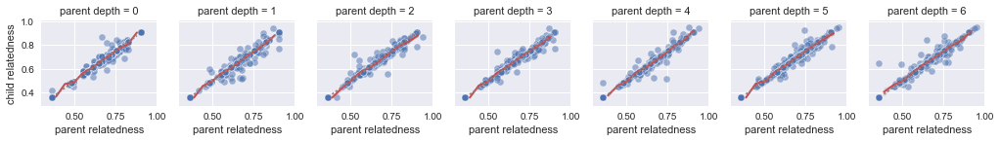

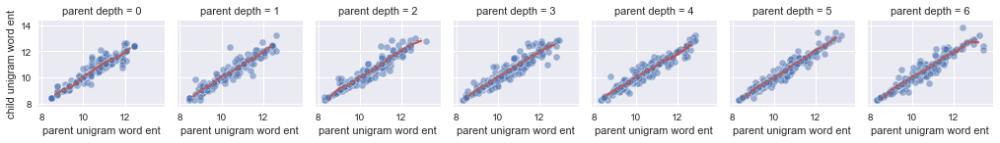

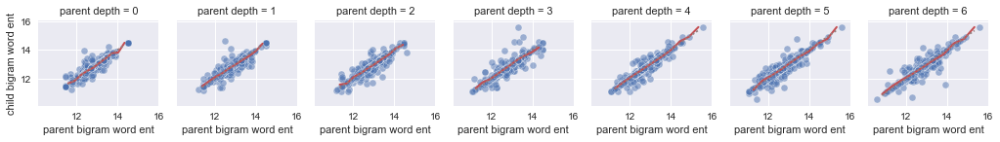

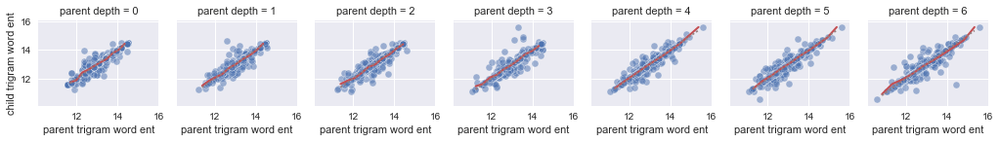

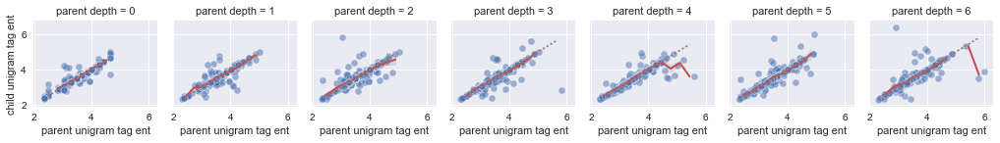

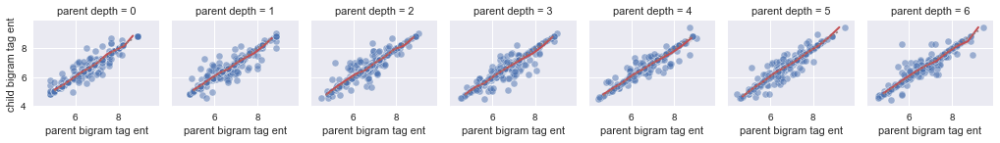

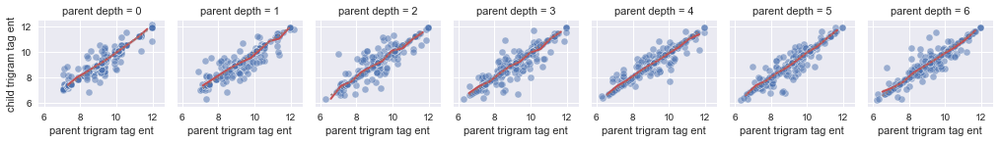

In [33]:
for feature in length_features+features:
    g = sb.FacetGrid(data=data,
                     dropna=False, col='parent depth',
                     col_wrap=10, size=2)
    g.map(plt.scatter, 'parent ' + feature, 'child ' + feature,
          alpha=.5, linewidth=.5, edgecolor="white")
    g.map_dataframe(plot_variation, feature=feature, color=sb.color_palette()[2],
                    binning=10 if feature in continuous_features else None)
    g.set_xlabels('parent ' + feature)
    g.set_ylabels('child ' + feature)

### 3.2.3 Parent feature ~ child feature / tree

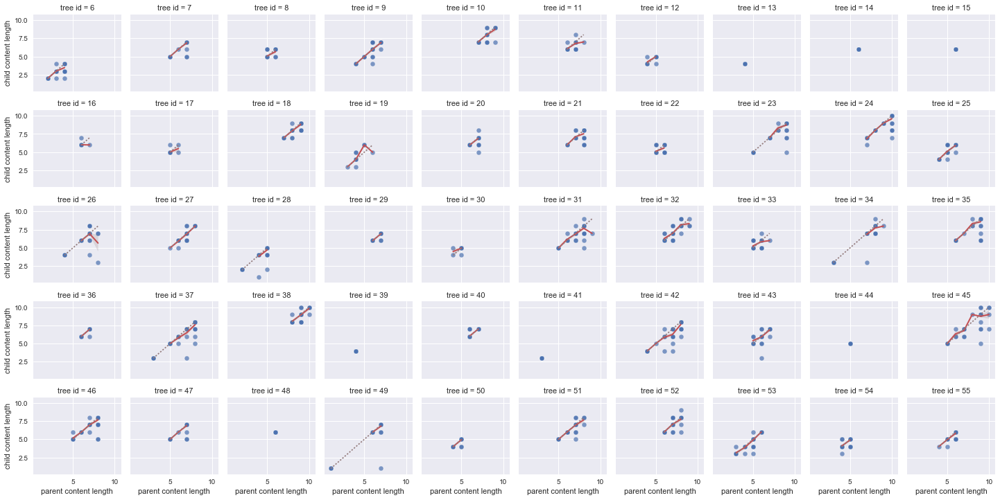

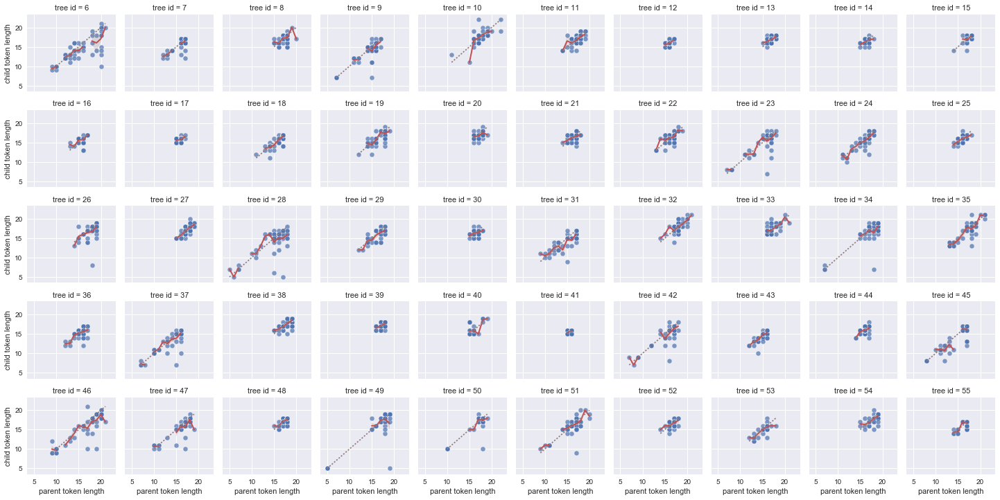

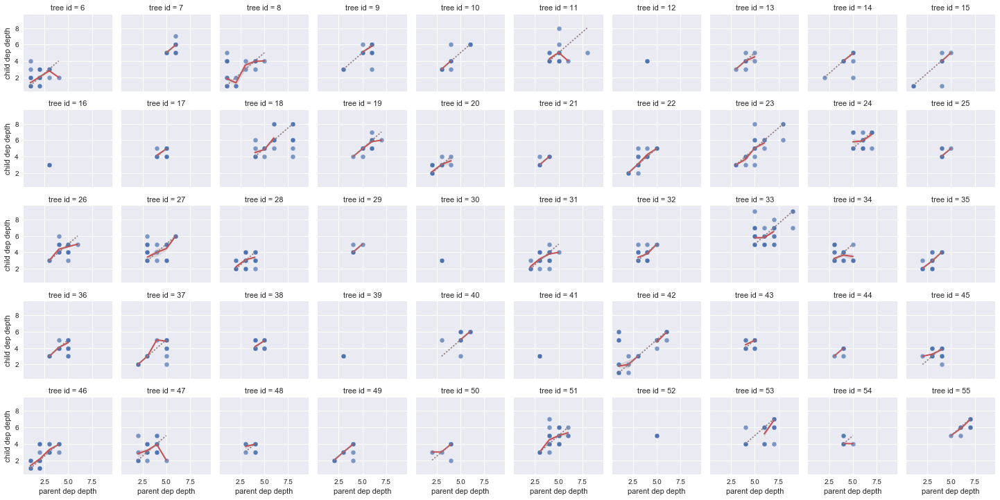

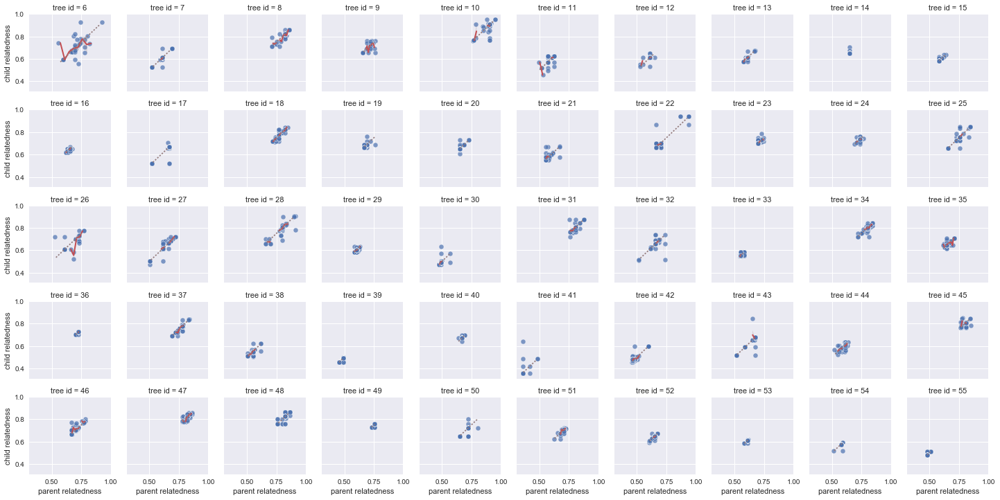

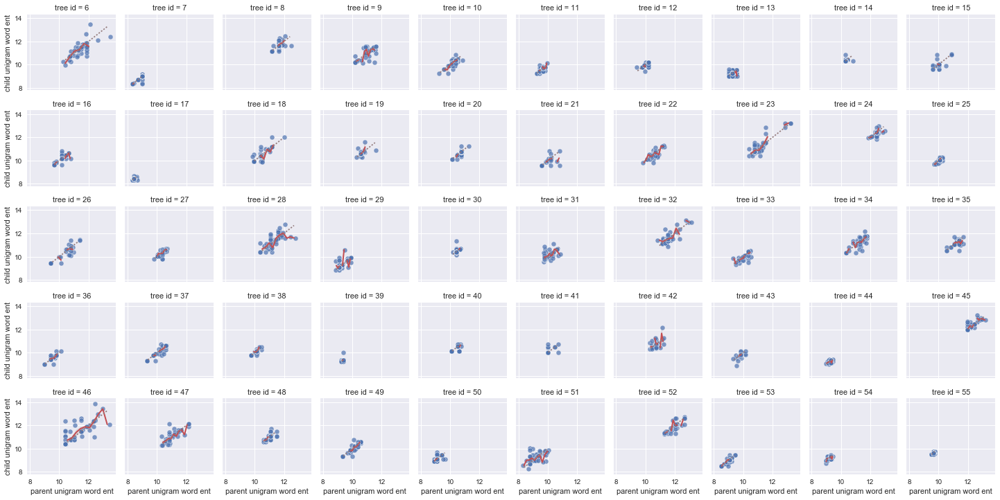

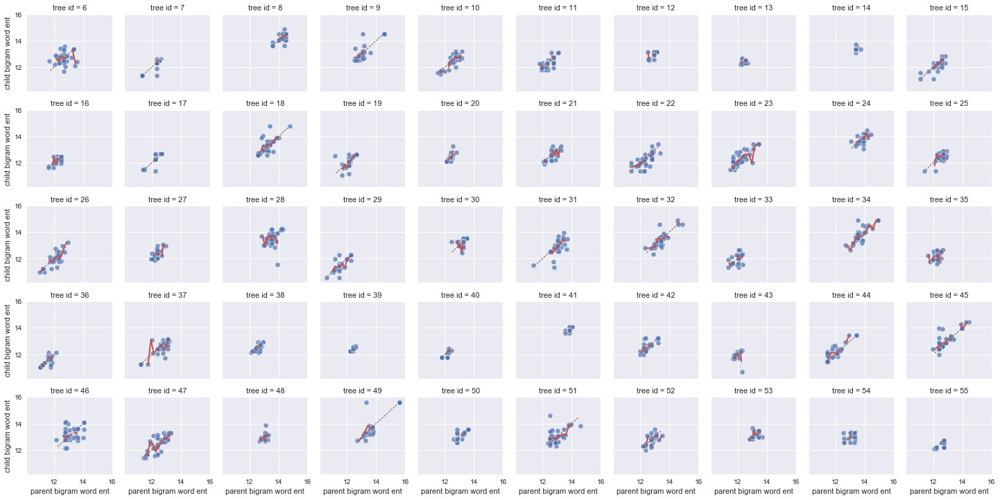

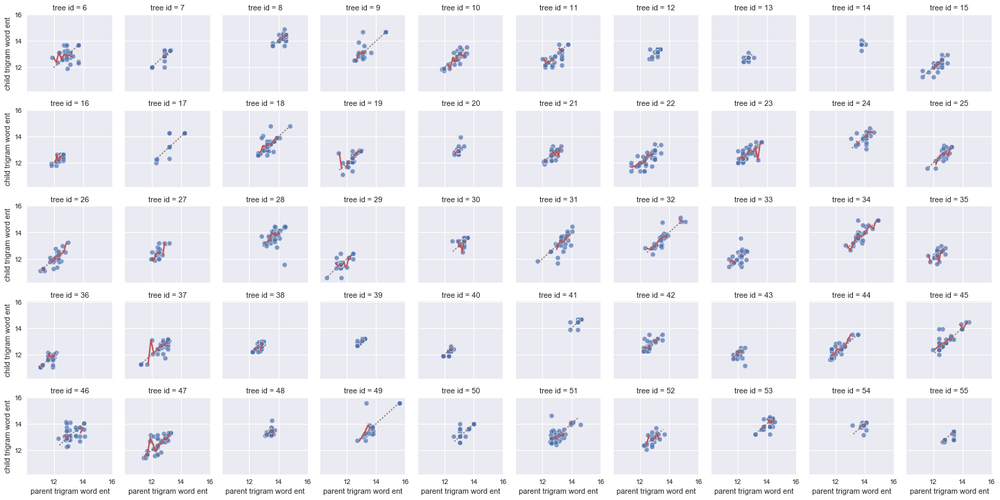

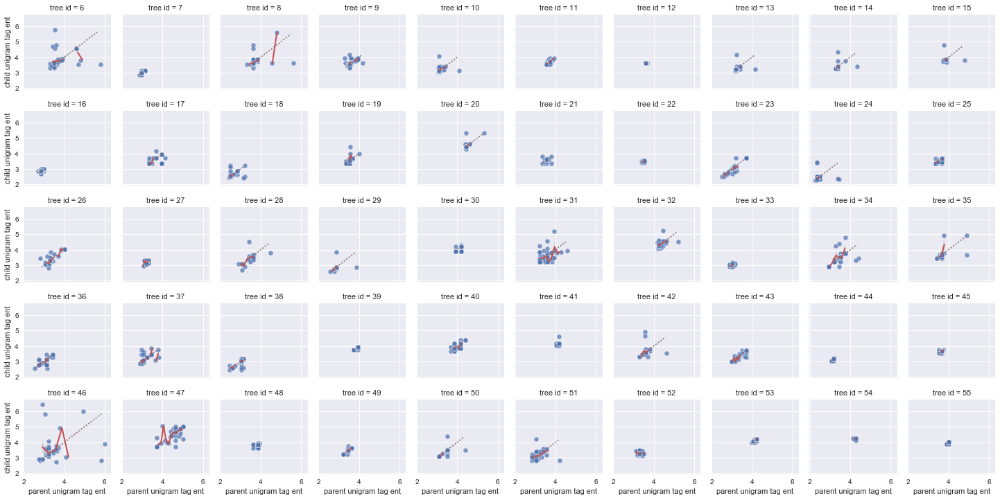

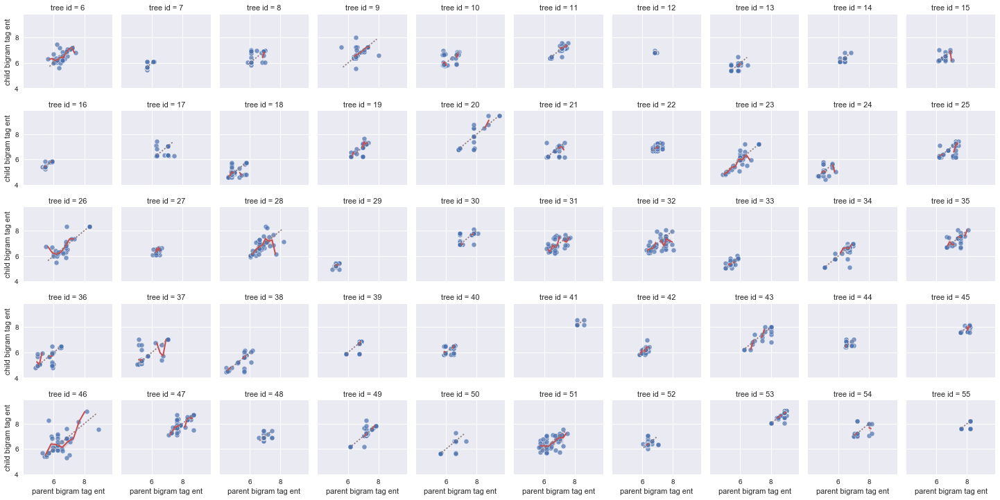

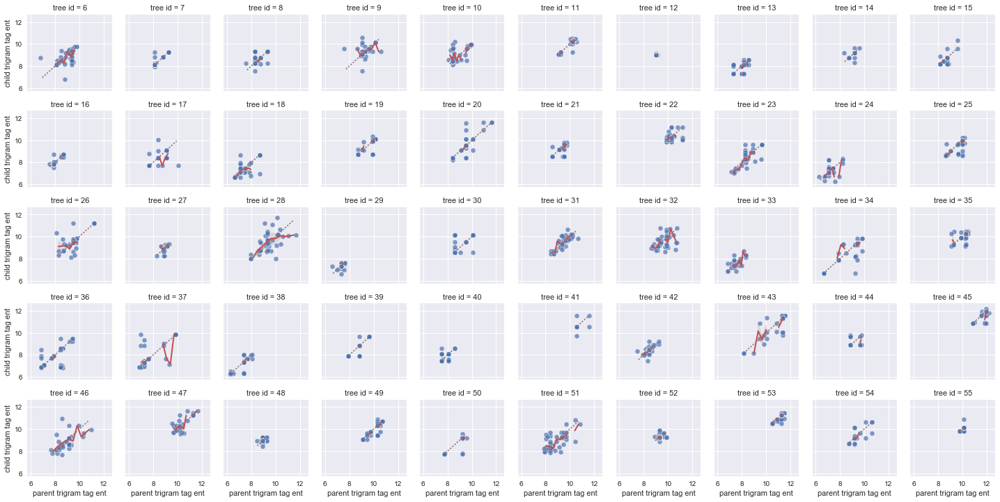

In [34]:
for feature in length_features+features:
    g = sb.FacetGrid(data=data,
                     dropna=False, col='tree id',
                     col_wrap=10, size=2)
    g.map(plt.scatter, 'parent ' + feature, 'child ' + feature,
          alpha=.7, linewidth=.5, edgecolor="white")
    g.map_dataframe(plot_variation, feature=feature, color=sb.color_palette()[2],
                    binning=10 if feature in continuous_features else None)
    g.set_xlabels('parent ' + feature)
    g.set_ylabels('child ' + feature)

### 3.2.4 Parent feature ~ child feature / parent number of content words

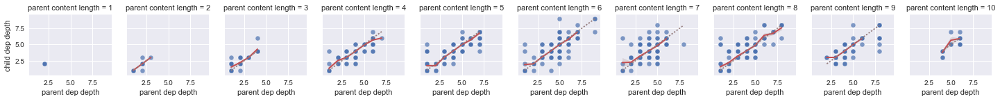

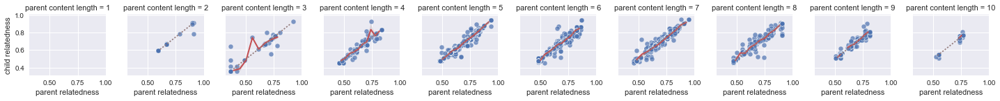

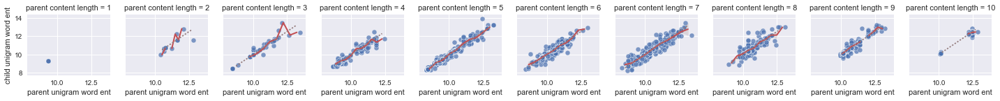

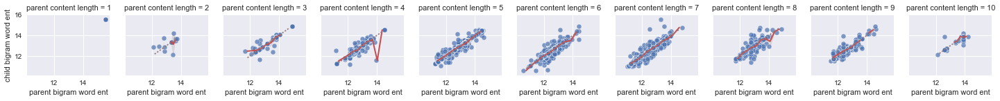

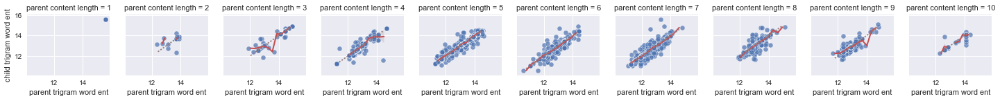

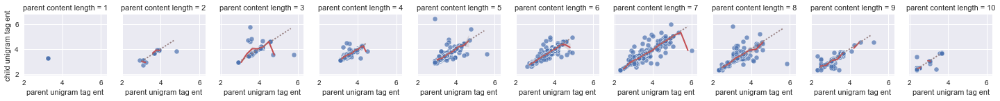

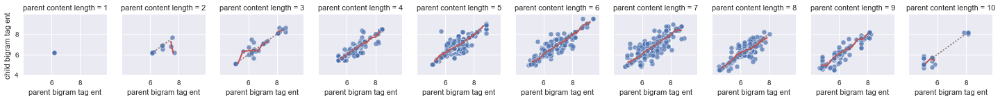

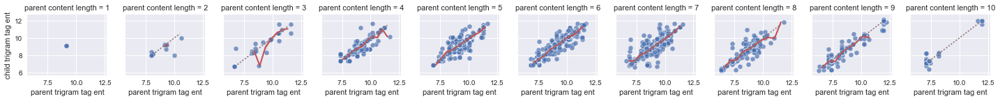

In [35]:
for feature in features:
    g = sb.FacetGrid(data=data,
                     dropna=False, col='parent content length',
                     col_wrap=10, size=2)
    g.map(plt.scatter, 'parent ' + feature, 'child ' + feature,
          alpha=.7, linewidth=.5, edgecolor="white")
    g.map_dataframe(plot_variation, feature=feature, color=sb.color_palette()[2],
                    binning=10 if feature in continuous_features else None)
    g.set_xlabels('parent ' + feature)
    g.set_ylabels('child ' + feature)